## Machine Learning Molecular Structure Predictor



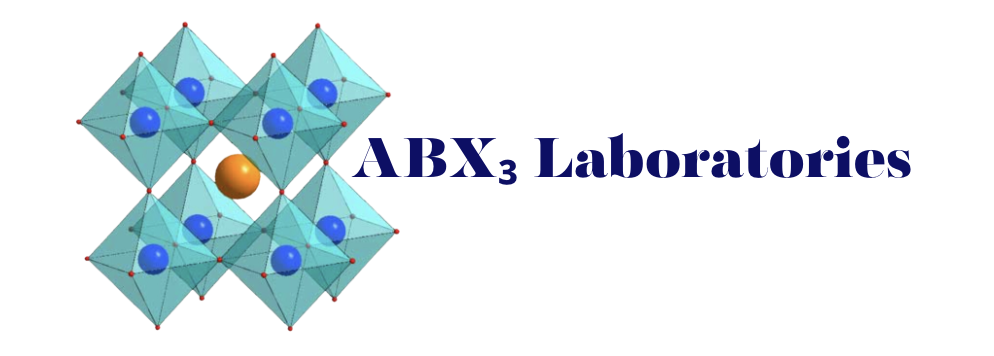

# Overview

This project explores different machine learning algorithms to predict the lowest distortion in perovskite structures, which is a critical aspect in ceramic science, materials physics, and solid-state inorganic chemistry. Researchers have identified a total of 73 elements in the A and B cation sites of ABO3 structures, leading to numerous oxides of the perovskite type. 

The objective is to develop models capable of accurately classifying perovskite structures based on features such as electronegativity, ionic radius, valence, and bond lengths of A-O and B-O pairs, thereby aiding in the prediction and optimization of material properties. Model performance is assessed using the Accuracy Score metric.


# Business Problem

Here we will take a look at the [Kaggle Crystal Structure Dataset] (https://www.kaggle.com/datasets/meetnagadia/crystal-structure-dataset/data). Each record represents a different Perovskite structures based on their characteristics. The data consists of 4,165 ABO3 perovskite-type oxides. Each observation is described by 13 feature columns and 1 class column which identifies it to be either a cubic, tetragonal, orthorhombic, and rhombohedral structure.

A Research Laboratory has asked for an analysis of a dataset to help understand the relationships between various physical and chemical properties of perovskite materials and their crystal structure types.

This project will determine:
<ol>
    <li> If there are any discernable patterns or correlations among the different variables and perovskite structure types?
    <li> How well features like the Glodschmidt tolerance factor, the electronegativity, and octahedral factor contribute to the predictive accuracy of the classification model? 
    <li> Are there any limitations or challenges in interpreting the model's predictions based on the selected features? 
</ol>

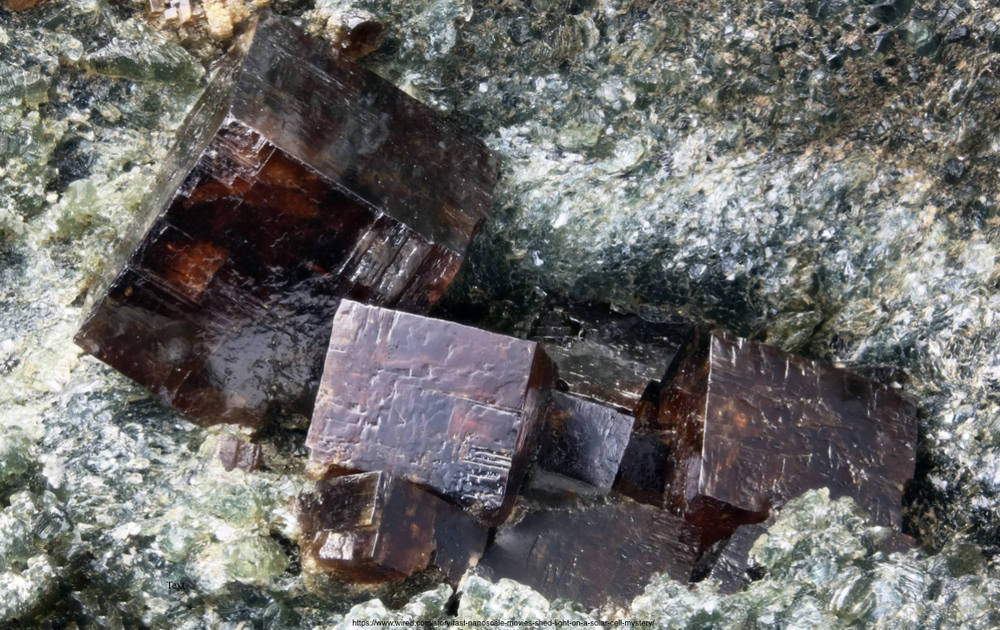

# Data Understanding

The data consists of 4,165 ABO3 perovskite-type oxides. Each observation is described by 13 feature columns and 1 class column which identifies it to be either a cubic, tetragonal, orthorhombic, and rhombohedral structure.(2)

Missing Values: In the case of data quality, missing or inconsistent data were handled on a case by case basis. Some considerations made were the relative importance of the variable in the analysis, how much data was needed, and finally, the possibility of filling data with a central measure of tendency and the statistical implications.

# Data Preparation (EDA)

In [1]:
# Import the necessary packages

#Third Party Packages
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import *
from sklearn.metrics import *
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, roc_auc_score
import numpy as np
from sklearn.ensemble import RandomForestClassifier
import time
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report
from sklearn.inspection import permutation_importance
from sklearn.metrics import ConfusionMatrixDisplay


In [2]:
# Create DataFrame
prv_train = pd.read_csv("Data/Perovskite_train.csv")

# Display
print("Total number of results:", len(prv_train))
display(prv_train.head()) # Using display instead of print leads to a neater output


Total number of results: 4165


,v(A),v(B),r(AXII)(Å),r(AVI)(Å),r(BVI)(Å),EN(A),EN(B),l(A-O)(Å),l(B-O)(Å),ΔENR,tG,τ,μ,Lowest distortion
0,0,0,0.52,0.52,0.93,2.18,2.54,2.214685,2.313698,-1.728214,0.582680,0.000000,0.664286,cubic
1,0,0,1.03,0.86,0.60,1.27,1.90,2.500930,0.000000,-1.768643,0.859135,0.000000,0.428571,cubic
2,2,4,0.92,0.67,0.53,1.83,1.88,2.290644,1.930311,-1.468464,0.849994,4.936558,0.378571,cubic
3,1,5,1.64,1.38,0.62,0.82,2.36,3.025719,1.745600,-1.974429,1.064161,3.977376,0.442857,orthorhombic
4,0,0,0.57,0.57,0.71,2.20,1.30,2.300109,2.027412,-1.622357,0.660190,0.000000,0.507143,cubic


In [3]:
# Rename columns in prv_train DataFrame 
#(pep8 standard, a line of code should not exceed 79 characters
#so each renaming is it's own line)
prv_train = prv_train.rename(columns={'v(A)': 'vA'})
prv_train = prv_train.rename(columns={'v(B)': 'vB'})
prv_train = prv_train.rename(columns={'r(AXII)(Å)': 'r_A12'})
prv_train = prv_train.rename(columns={'r(AVI)(Å)': 'r_A6'})
prv_train = prv_train.rename(columns={'r(BVI)(Å)': 'r_B6'})
prv_train = prv_train.rename(columns={'EN(A)': 'EN_A'})
prv_train = prv_train.rename(columns={'EN(B)': 'EN_B'})
prv_train = prv_train.rename(columns={'l(A-O)(Å)': 'bond_len_AO'})
prv_train = prv_train.rename(columns={'l(B-O)(Å)': 'bond_len_BO'})
prv_train = prv_train.rename(columns={'ΔENR': 'ENR_diff'})
prv_train = prv_train.rename(columns={'τ': 'tau'})
prv_train = prv_train.rename(columns={'μ': 'mu'})
prv_train = prv_train.rename(columns={'Lowest distortion': 'lowest_distortion'})


In [4]:
# Get summary
display(prv_train.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4165 entries, 0 to 4164
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   vA                 4165 non-null   int64  
 1   vB                 4165 non-null   int64  
 2   r_A12              4165 non-null   float64
 3   r_A6               4165 non-null   float64
 4   r_B6               4165 non-null   float64
 5   EN_A               4165 non-null   float64
 6   EN_B               4165 non-null   float64
 7   bond_len_AO        4165 non-null   float64
 8   bond_len_BO        4165 non-null   float64
 9   ENR_diff           4165 non-null   float64
 10  tG                 4165 non-null   float64
 11  tau                4165 non-null   float64
 12  mu                 4165 non-null   float64
 13  lowest_distortion  4165 non-null   object 
dtypes: float64(11), int64(2), object(1)
memory usage: 455.7+ KB


None

List of Feature (or attributes, either work) Descriptions

* `vA` : Valence of A
* `vB` : Valence of B
* `r_A6` : ionic radius of A cation (A6)
* `r_A12` : ionic radius of A cation (a second one, A12)
* `r_B6` : ionic radius of B cation
* `EN_A` : Average electronegativity value of A cation
* `EN_B` : Average electronegativity value of B cation
* `bond_len_AO` : Bond length of A-O pair
* `bond_len_BO` : Bond length of B-O pair
* `ENR_diff` : Electronegativity difference with radius
* `tG` : Goldschmidt tolerance factor
* `tau` : New tolerance factor
* `mu` : Octahedral factor


This is a multiclass, imbalanced dataset. The cubic structure is far more common than any other dataset.

$$\tau = \frac{r_A + r_B}{\sqrt{2}(r_O) + l_{B-O} - l_{A-O}}$$
<br>
<div style="text-align: center; padding-left: 150px;">
    <ul style="list-style-position: inside; text-align: left;">
        <li>r<sub>A</sub> is the ionic radius of the A-site cation.</li>
        <li>r<sub>B</sub> is the ionic radius of the B-site cation.</li>
        <li>r<sub>O</sub> is the radius of the oxygen ion.</li>
        <li>l<sub>A-O</sub> is the bond length of the A-O pair.</li>
        <li>l<sub>B-O</sub> is the bond length of the B-O pair.</li>
    </ul>
</div>



Mathematically, the Goldschmidt tolerance factor (tG) is given by:

$$ t_G = \frac{r_A + r_B}{2(r_O)} $$


<br>
<div style="text-align: center; padding-left: 150px;">
    <ul style="list-style-position: inside; text-align: left;">
        <li>(r_A) is the ionic radius of the A-site cation.</li>
        <li>(r_B) is the ionic radius of the B-site cation.</li>
        <li>(r_O) is the radius of the oxygen ion.</li>
        
</div>



Side quest (because it is interesting). The above formulas give context, which is extra data that many times won't be available. Here latex is used to write formulas so that the raw data, which is being treated as experimental data, can be used to better put the data in context and understand potential relationships.

In [5]:
# Select columns with data type 'object'
string_col = prv_train.select_dtypes(include="object").columns

# Convert selected columns to the 'string' data type
prv_train[string_col] = prv_train[string_col].astype("string")


In [6]:
# Get summary
display(prv_train.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4165 entries, 0 to 4164
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   vA                 4165 non-null   int64  
 1   vB                 4165 non-null   int64  
 2   r_A12              4165 non-null   float64
 3   r_A6               4165 non-null   float64
 4   r_B6               4165 non-null   float64
 5   EN_A               4165 non-null   float64
 6   EN_B               4165 non-null   float64
 7   bond_len_AO        4165 non-null   float64
 8   bond_len_BO        4165 non-null   float64
 9   ENR_diff           4165 non-null   float64
 10  tG                 4165 non-null   float64
 11  tau                4165 non-null   float64
 12  mu                 4165 non-null   float64
 13  lowest_distortion  4165 non-null   string 
dtypes: float64(11), int64(2), string(1)
memory usage: 455.7 KB


None

The object data has been converted to string. 

It appears there are two measurements for the radius of the A cation, labeled as "r(AXII)(Å)" and "r(AVI)(Å)". This duplication could be due to different conventions or sources of data.

Here's a potential explanation for why there might be two A radius measurements in technical terms:

Different Coordination Numbers (CN):

"r(AXII)(Å)" and "r(AVI)(Å)" might represent the ionic radius of the A cation under different coordination environments.
The notation "AXII" could indicate a coordination number of 12 (dodecahedral coordination), while "AVI" could indicate a coordination number of 6 (octahedral coordination).

When considering the context of perovskite structures, the radius for a perovskite could be 6 or 12 angstroms due to the variations in the arrangement and composition of the atoms within the crystal lattice.

In laymen's terms:(with help from wikipedia)

Simple Structure: Where the perovskite structure follows the ABX3 formula precisely, the radius could be 6 angstroms. This simple structure consists of specific arrangements of atoms where the 'A' atom (usually larger) is surrounded by an octahedron of oxygen atoms, and the 'B' atom (usually smaller) sits at the center of the octahedron.

Complex Structures: Perovskites can also have more complex arrangements, especially when there are variations or substitutions in the 'A' and 'B' sites. For example, in ordered double perovskites like A2BB’O6, or in disordered perovskites like A(BB’)O3, the arrangement of atoms can differ, leading to variations in the radius. In such cases, the radius could be larger, around 12 angstroms, due to changes in the atomic arrangement and coordination.

Basically, there are two columns due to atomic arrangements; factors such as the types of ions present, their sizes, and their positions within the crystal lattice can influence the overall size of the perovskite structure. These variations in atomic arrangements and compositions can lead to different radii for perovskite structures.

Unfortunately, no atomic data is provided.



In [7]:
# Create a copy of the DataFrame to avoid altering the original
prv_train_num = prv_train.copy()

# Select columns with data type 'string'
string_col=prv_train_num.select_dtypes("string").columns.to_list()

In [8]:
# Extract column names of prv_train_num DataFrame and store them in num_col
num_col = prv_train_num.columns.to_list()


# Remove the column "Lowest distortion" from num_col
num_col.remove("lowest_distortion")
print(num_col)


['vA', 'vB', 'r_A12', 'r_A6', 'r_B6', 'EN_A', 'EN_B', 'bond_len_AO', 'bond_len_BO', 'ENR_diff', 'tG', 'tau', 'mu']


For this project, it doesn't really remove anything, but if there were hundreds of columns then the strings would get in the way of the data describe and so generally they would be removed this way before describing the data.

This line generates a summary statistics table for the DataFrame prv_train_num. The `.describe()` method calculates summary statistics for numerical columns by default. The `.T` at the end is a transpose operation, which swaps the rows and columns of the summary statistics table. This operation is performed to make the table more readable, with variables as rows and summary statistics as columns. This is often done to have a better visual representation of the data, especially when there are many columns, as is the case with this data set.



In [9]:
prv_train_num.describe().T

,count,mean,std,min,25%,50%,75%,max
vA,4165.0,0.882353,1.672111,-1.000000,-1.000000,0.000000,2.000000,5.000000
vB,4165.0,1.385114,2.161707,-1.000000,-1.000000,0.000000,3.000000,5.000000
r_A12,4165.0,1.005570,0.336940,0.270000,0.730000,0.980000,1.240000,1.880000
r_A6,4165.0,0.841789,0.240549,0.270000,0.670000,0.860000,0.960000,1.670000
r_B6,4165.0,0.801999,0.234891,0.270000,0.630000,0.760000,0.940000,1.670000
EN_A,4165.0,1.547309,0.447277,0.790000,1.200000,1.500000,1.910000,2.540000
EN_B,4165.0,1.599059,0.442961,0.790000,1.220000,1.600000,1.960000,2.540000
bond_len_AO,4165.0,2.323011,0.635699,0.000000,2.294004,2.422517,2.582926,3.300176
bond_len_BO,4165.0,2.017219,0.555599,0.000000,1.956808,2.075849,2.284156,3.009747
ENR_diff,4165.0,-2.186093,0.636470,-5.411536,-2.570036,-2.084214,-1.734643,-0.601714


Looking at Tau, the zeros could be a problem. The max value is also 305 (which may likely be an outlier) with a listed mean of 1.3. Further investigation around this is needed. This column may need to be dropped.

EN(A) and EN(B) have the same values indicating that they are distributed the same. 

Some of the bond lengths are displaying zero and will need to be investigated further (domain knowledge says that this is impossible).

If the valence(A) and (B) are both zero, in this dataset, it implies that both cations (A and B) are essentially neutral, meaning they have no charge. This scenario is highly unlikely and not physically meaningful in the context of perovskite compounds because A and B cations typically have non-zero valence states to contribute to the overall charge balance of the compound.

Therefore, in this dataset, the occurrence of both A and B having zero valence is likely an artifact or error rather than a meaningful data point. It's important to review the data and ensure its integrity, an occurrence like this may indicate issues with data collection or processing. These occurances may have to be dropped.

In [10]:
# Count the number of zeros in each column of the training dataset
zero_counts = prv_train.apply(lambda col: (col == 0).sum())
print("Count of zeros in each column:")
print(zero_counts)

Count of zeros in each column:
vA                    859
vB                    859
r_A12                   0
r_A6                    0
r_B6                    0
EN_A                    0
EN_B                    0
bond_len_AO           254
bond_len_BO           243
ENR_diff                0
tG                      0
tau                  2177
mu                      0
lowest_distortion       0
dtype: int64


The `tau` column, representing the New tolerance factor, is helpful for several reasons:

1. **Structural Stability Assessment**: The New tolerance factor `tau` provides insight into the structural stability of perovskite compounds. It considers the ionic radii of the A and B cations and the oxygen ion as well as the bond lengths between these ions. By incorporating bond lengths, `tau` offers a comprehensive assessment of the compound's structural stability compared to the traditional Goldschmidt tolerance factor `t_G`.

2. **Prediction of Crystal Structures**: `tau` can be used as a predictive metric to estimate the likelihood of specific crystal structures in perovskite compounds. Different crystal structures, such as cubic, tetragonal, orthorhombic, and rhombohedral, may have characteristic ranges of `tau` values. Therefore, analyzing `tau` alongside experimental data can help researchers predict or identify the most probable crystal structure of a perovskite compound.

3. **Guidance for Materials Design**: Understanding the relationship between `tau` and crystal structures can guide scientists in designing new perovskite materials with desired properties. By manipulating factors that influence `tau`, such as cation ionic radii and bond lengths, researchers can tailor the crystal structure of perovskite compounds to achieve specific functional properties, such as electronic, magnetic, or optical behavior.

4. **Comparative Analysis**: `tau` allows for comparative analysis between different perovskite compounds or compositions. Researchers can use `tau` to compare the structural stability of various perovskite materials and identify trends or correlations between `tau` values and other material properties. This comparative analysis can inform the selection of perovskite compositions for specific applications or research objectives.

So it would be worth our time to investigate the effectiveness of the model both with and without Tau.


In [11]:
# Create a copy of the DataFrame to avoid altering the original
prv_train_tau = prv_train.copy()

# Drop rows with zero values
prv_train_tau = prv_train_tau[prv_train_tau['tau'] != 0]

# Display
print("Total number of results:", len(prv_train_tau))
display(prv_train_tau.head())

Total number of results: 1988


,vA,vB,r_A12,r_A6,r_B6,EN_A,EN_B,bond_len_AO,bond_len_BO,ENR_diff,tG,tau,mu,lowest_distortion
2,2,4,0.92,0.67,0.53,1.83,1.88,2.290644,1.930311,-1.468464,0.849994,4.936558,0.378571,cubic
3,1,5,1.64,1.38,0.62,0.82,2.36,3.025719,1.745600,-1.974429,1.064161,3.977376,0.442857,orthorhombic
6,1,5,0.92,0.80,0.62,1.78,2.36,2.392362,1.745600,-1.484143,0.812123,5.017992,0.442857,cubic
10,3,3,1.36,1.03,0.90,1.10,1.23,2.689119,2.258656,-2.931286,0.848528,3.536265,0.642857,orthorhombic
11,2,4,1.19,0.99,0.61,1.22,1.54,2.550861,1.927849,-2.040571,0.911148,4.133678,0.435714,orthorhombic


In [12]:
# Count the number of zeros in each column of the training dataset with tolerance factor (tau)
zero_counts = prv_train_tau.apply(lambda col: (col == 0).sum())
print("Count of zeros in each column:")
print(zero_counts)

Count of zeros in each column:
vA                   0
vB                   0
r_A12                0
r_A6                 0
r_B6                 0
EN_A                 0
EN_B                 0
bond_len_AO          0
bond_len_BO          0
ENR_diff             0
tG                   0
tau                  0
mu                   0
lowest_distortion    0
dtype: int64


In [13]:
# Create a copy of the DataFrame to avoid altering the original
prv_train_no_tau = prv_train.copy()

# Drop tau column
prv_train_no_tau.drop(['tau'], axis=1, inplace=True)

# Display
print("Total number of results:", len(prv_train_no_tau))
display(prv_train_no_tau.head())

Total number of results: 4165


,vA,vB,r_A12,r_A6,r_B6,EN_A,EN_B,bond_len_AO,bond_len_BO,ENR_diff,tG,mu,lowest_distortion
0,0,0,0.52,0.52,0.93,2.18,2.54,2.214685,2.313698,-1.728214,0.582680,0.664286,cubic
1,0,0,1.03,0.86,0.60,1.27,1.90,2.500930,0.000000,-1.768643,0.859135,0.428571,cubic
2,2,4,0.92,0.67,0.53,1.83,1.88,2.290644,1.930311,-1.468464,0.849994,0.378571,cubic
3,1,5,1.64,1.38,0.62,0.82,2.36,3.025719,1.745600,-1.974429,1.064161,0.442857,orthorhombic
4,0,0,0.57,0.57,0.71,2.20,1.30,2.300109,2.027412,-1.622357,0.660190,0.507143,cubic


In [14]:
# Count the number of zeros in each column of the training dataset without tolerance factor (tau)
zero_counts = prv_train_no_tau.apply(lambda col: (col == 0).sum())

# Print a message indicating the count of zeros in each column.
print("Count of zeros in each column:")

# Print the variable zero_counts, which contains the count of zeros in each column
# of the DataFrame prv_train_no_tau.
print(zero_counts)



Count of zeros in each column:
vA                   859
vB                   859
r_A12                  0
r_A6                   0
r_B6                   0
EN_A                   0
EN_B                   0
bond_len_AO          254
bond_len_BO          243
ENR_diff               0
tG                     0
mu                     0
lowest_distortion      0
dtype: int64


Now the question: Should these zero values be left to skew the data to be incorrect or should they be dropped? 

vA and vB are crucial factors so zero values for those features would really not give any meaningful results. The dataset could be split here but then there would be multiple analyses on various datasets and not evaluations of various machine learning models. So these values will be dropped to limit the number of datasets and maximize the number of machine learning models.

Every time there's a column or row with bad data there's an opportunity to drop that data. In this case, the zero count was so low, it was worth dropping the errors. 

In [15]:
# Drop rows with zero values
prv_train_no_tau = prv_train_no_tau[prv_train_no_tau['vA'] != 0]

# Display
print("Total number of results:", len(prv_train_no_tau))
display(prv_train_no_tau.head())

Total number of results: 3306


,vA,vB,r_A12,r_A6,r_B6,EN_A,EN_B,bond_len_AO,bond_len_BO,ENR_diff,tG,mu,lowest_distortion
2,2,4,0.92,0.67,0.53,1.83,1.88,2.290644,1.930311,-1.468464,0.849994,0.378571,cubic
3,1,5,1.64,1.38,0.62,0.82,2.36,3.025719,1.745600,-1.974429,1.064161,0.442857,orthorhombic
6,1,5,0.92,0.80,0.62,1.78,2.36,2.392362,1.745600,-1.484143,0.812123,0.442857,cubic
10,3,3,1.36,1.03,0.90,1.10,1.23,2.689119,2.258656,-2.931286,0.848528,0.642857,orthorhombic
11,2,4,1.19,0.99,0.61,1.22,1.54,2.550861,1.927849,-2.040571,0.911148,0.435714,orthorhombic


In [16]:
# Count the number of zeros in each column of the training dataset without tolerance factor (tau)
zero_counts = prv_train_no_tau.apply(lambda col: (col == 0).sum())
print("Count of zeros in each column:")
print(zero_counts)

Count of zeros in each column:
vA                   0
vB                   0
r_A12                0
r_A6                 0
r_B6                 0
EN_A                 0
EN_B                 0
bond_len_AO          0
bond_len_BO          0
ENR_diff             0
tG                   0
mu                   0
lowest_distortion    0
dtype: int64


Where vA was zero, it appears that vB and also bond_len_AO and bond_len_BO are all also zero. So only the zeros from vA needed to be dropped.

In [17]:
# Accessing -1 values 
prv_train_no_tau.loc[prv_train_no_tau['vA'] == -1]


,vA,vB,r_A12,r_A6,r_B6,EN_A,EN_B,bond_len_AO,bond_len_BO,ENR_diff,tG,mu,lowest_distortion
20,-1,-1,1.24,0.96,0.99,1.17,1.22,2.611965,2.255581,-3.002036,0.781072,0.707143,cubic
21,-1,-1,1.70,1.20,0.80,1.62,1.78,2.531967,2.147681,-2.510714,0.996378,0.571429,orthorhombic
23,-1,-1,0.27,0.27,0.27,2.04,2.04,1.891523,1.624662,-0.601714,0.707107,0.192857,cubic
24,-1,-1,0.63,0.63,0.90,2.20,2.02,2.311295,2.215655,-1.823786,0.624099,0.642857,cubic
30,-1,-1,0.90,0.63,1.52,1.88,0.82,2.233563,2.825997,-3.556429,0.556968,1.085714,rhombohedral
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4137,-1,-1,0.68,0.68,0.90,2.05,2.02,2.361079,2.215655,-1.897357,0.639470,0.642857,cubic
4142,-1,-1,0.45,0.45,1.11,1.57,2.00,2.178342,2.323655,-2.336464,0.521174,0.792857,cubic
4143,-1,-1,0.87,0.75,0.62,1.36,1.55,2.417029,2.169994,-1.809536,0.794620,0.442857,cubic
4146,-1,-1,1.03,0.86,0.77,1.27,2.10,2.500930,2.115492,-2.035679,0.791829,0.550000,cubic


This might be two data sets combined. All perovskites contain two positively charged ions (A and B). Positively charged ions are called cations and are bonded to negatively charged atoms. A negative value for a valence electron count would indicate an overall negative charge. Since the compound will have a balance of charges, this value may indicate some inconsistency.  


Data set 1: has valence electrons reported for each entry and a tau calculation. 
Data set 2: doesn't contain valence electrons or a calculated tau value. 

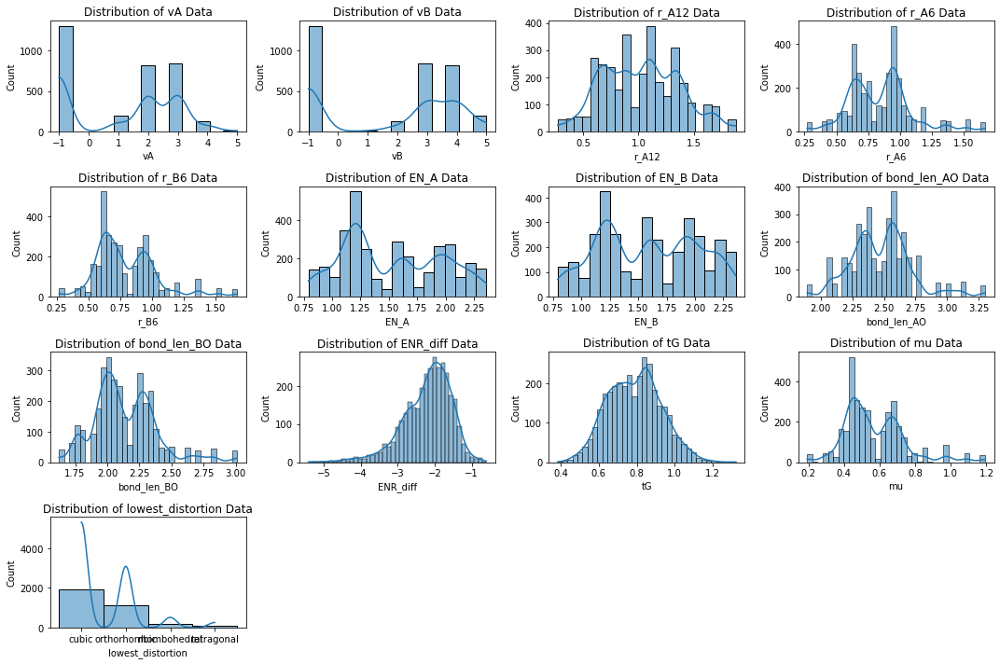

In [18]:
# Set up the figure size for the plot
plt.figure(figsize=(15,10))

# Iterate over each column in the dataframe
for i, col in enumerate(prv_train_no_tau.columns, 1):
    # Create subplots in a 4x4 grid
    plt.subplot(4, 4, i)
    
    # Set title for each subplot indicating the distribution of data for the corresponding column
    plt.title(f"Distribution of {col} Data")
    
    # Plot the histogram with kernel density estimation using seaborn's histplot function
    sns.histplot(prv_train_no_tau[col], kde=True)
    
    # Adjust subplot layout
    plt.tight_layout()
    
    # Ensure the plot is shown
    plt.plot()


The valence electrons should add up to 6. A '-1' value seems to be used as a placeholder. Drop all rows with a -1 value. 



In [19]:
# Drop rows with -1 values
prv_train_no_tau = prv_train_no_tau[prv_train_no_tau['vA'] != -1]

# Display
print("Total number of results:", len(prv_train_no_tau))
display(prv_train_no_tau.head())

Total number of results: 2007


,vA,vB,r_A12,r_A6,r_B6,EN_A,EN_B,bond_len_AO,bond_len_BO,ENR_diff,tG,mu,lowest_distortion
2,2,4,0.92,0.67,0.53,1.83,1.88,2.290644,1.930311,-1.468464,0.849994,0.378571,cubic
3,1,5,1.64,1.38,0.62,0.82,2.36,3.025719,1.745600,-1.974429,1.064161,0.442857,orthorhombic
6,1,5,0.92,0.80,0.62,1.78,2.36,2.392362,1.745600,-1.484143,0.812123,0.442857,cubic
10,3,3,1.36,1.03,0.90,1.10,1.23,2.689119,2.258656,-2.931286,0.848528,0.642857,orthorhombic
11,2,4,1.19,0.99,0.61,1.22,1.54,2.550861,1.927849,-2.040571,0.911148,0.435714,orthorhombic


Next, let's take a look at maximizing the number of data points. What would the data set look like if the valence electron columns and the tau column were dropped? Would there be any zeros left in the data set?

In [20]:
# Create a copy of the DataFrame to avoid altering the original
prv_train_no_tau_no_v = prv_train.copy()

# Drop tau column
prv_train_no_tau_no_v.drop(['tau', 'vA', 'vB'], axis=1, inplace=True)

# Display
print("Total number of results:", len(prv_train_no_tau_no_v))
display(prv_train_no_tau_no_v.head())

Total number of results: 4165


,r_A12,r_A6,r_B6,EN_A,EN_B,bond_len_AO,bond_len_BO,ENR_diff,tG,mu,lowest_distortion
0,0.52,0.52,0.93,2.18,2.54,2.214685,2.313698,-1.728214,0.582680,0.664286,cubic
1,1.03,0.86,0.60,1.27,1.90,2.500930,0.000000,-1.768643,0.859135,0.428571,cubic
2,0.92,0.67,0.53,1.83,1.88,2.290644,1.930311,-1.468464,0.849994,0.378571,cubic
3,1.64,1.38,0.62,0.82,2.36,3.025719,1.745600,-1.974429,1.064161,0.442857,orthorhombic
4,0.57,0.57,0.71,2.20,1.30,2.300109,2.027412,-1.622357,0.660190,0.507143,cubic


In [21]:
# Count the number of zeros in each column of the training dataset without tolerance factor (tau) and valence (v)
zero_counts = prv_train_no_tau_no_v.apply(lambda col: (col == 0).sum())
print("Count of zeros in each column:")
print(zero_counts)

Count of zeros in each column:
r_A12                  0
r_A6                   0
r_B6                   0
EN_A                   0
EN_B                   0
bond_len_AO          254
bond_len_BO          243
ENR_diff               0
tG                     0
mu                     0
lowest_distortion      0
dtype: int64


Domain knowledge says that bond lengths cannot be zero so these values must be dropped. Also note that the bond length counts are different and may not occur in the same rows. The number of zero values is low so it is acceptable to drop these values.

In [22]:
# Drop rows with 0 values
prv_train_no_tau_no_v = prv_train_no_tau_no_v[prv_train_no_tau_no_v['bond_len_AO'] > 0]
prv_train_no_tau_no_v = prv_train_no_tau_no_v[prv_train_no_tau_no_v['bond_len_BO'] > 0]

# Display
print("Total number of results:", len(prv_train_no_tau_no_v))
display(prv_train_no_tau_no_v.head())


Total number of results: 3682


,r_A12,r_A6,r_B6,EN_A,EN_B,bond_len_AO,bond_len_BO,ENR_diff,tG,mu,lowest_distortion
0,0.52,0.52,0.93,2.18,2.54,2.214685,2.313698,-1.728214,0.582680,0.664286,cubic
2,0.92,0.67,0.53,1.83,1.88,2.290644,1.930311,-1.468464,0.849994,0.378571,cubic
3,1.64,1.38,0.62,0.82,2.36,3.025719,1.745600,-1.974429,1.064161,0.442857,orthorhombic
4,0.57,0.57,0.71,2.20,1.30,2.300109,2.027412,-1.622357,0.660190,0.507143,cubic
6,0.92,0.80,0.62,1.78,2.36,2.392362,1.745600,-1.484143,0.812123,0.442857,cubic


In [23]:
# Count the number of zeros in each column of the training dataset without tolerance factor (tau) and valence (v)
zero_counts = prv_train_no_tau_no_v.apply(lambda col: (col == 0).sum())
print("Count of zeros in each column:")
print(zero_counts)

Count of zeros in each column:
r_A12                0
r_A6                 0
r_B6                 0
EN_A                 0
EN_B                 0
bond_len_AO          0
bond_len_BO          0
ENR_diff             0
tG                   0
mu                   0
lowest_distortion    0
dtype: int64


## Choosing a final data set to train

### Comparing the perovskite data with tau and without tau.
In this section, it's really important to both consider removing columns or rows and how that impacts the integrity and completeness of the dataset. Specifically, we are considering different data set combinations that make use of different columns because that changes which rows are included in the dataset. 

### 1. Correlation Plots

In [24]:
# Create a correlation plot of the training dataset with tolerance factor (tau)
px.imshow(prv_train_tau.corr(),title="Correlation Plot of Perovskite Data with Tau")

Some notes on the correlation matrix: 

Strong Correlations:

Some variables exhibit strong correlations. For instance, there is a perfect negative correlation (-1) between vA and vB, indicating that they are inversely related. Similarly, r_A12 and r_A6, which likely represent different aspects of the same quantity, show a strong positive correlation (0.917346), suggesting they move in the same direction.
Variables such as bond_len_AO and bond_len_BO also show strong positive correlations (0.923351), implying a strong relationship between the bond lengths of A-O and B-O pairs.

Moderate Correlations:

There are moderate correlations between certain variables, such as tG and bond_len_AO (0.785924) or tG and r_A12 (0.863578). These correlations suggest some degree of relationship between the variables but may not be as strong as the highly correlated ones.

Weak Correlations:

Some variables exhibit weak correlations or no significant correlation at all. For example, the correlation between EN_A and EN_B is relatively low (-0.034935), indicating a weak relationship between the electronegativities of A and B cations.


Correlation does not imply causation. While correlated variables may move together, it does not necessarily mean that changes in one variable cause changes in the other. Understanding the physical or chemical relationship between variables can provide insights into why certain correlations exist and their implications.



In [25]:
# Create a correlation plot of the training dataset with tolerance factor (tau)
px.imshow(prv_train_no_tau.corr(),title="Correlation Plot of Perovskite Data without Tau")

In this correlation matrix, several noteworthy observations can be made:

Strong Positive Correlations:

Variables such as vA and vB (0.813366), r_A12 and r_A6 (0.935433), bond_len_AO and bond_len_BO (0.938676), and bond_len_BO and EN_diff (0.907513) exhibit strong positive correlations. These correlations suggest that changes in one variable tend to be associated with similar changes in the other variable. It is interesting that the EN_diff and the bond_len_BO are directly related while the EN_diff and the EN_A are inversely (see next statement).

Strong Negative Correlations:

There are also strong negative correlations observed, such as between r_B6 and tG (-0.842273) or between EN_diff and EN_A (-0.842273). These negative correlations suggest an inverse relationship between the variables.

Moderate Correlations:

Moderate correlations are present between various pairs of variables, such as vA and tG (0.215130), vB and tG (0.342345), bond_len_AO and r_A12 (0.905104), or EN_B and EN_diff (0.674963). These moderate correlations indicate a discernible but not excessively strong relationship between the variables.



Summary

Comparing and contrasting the two correlation matrices:

Strength of Correlations:

Matrix 1 (with tau): Contains several strong correlations, both positive and negative, with correlation coefficients close to 1 or -1.
Matrix 2 (without tau): Exhibits fewer strong correlations compared to Matrix 1, with more moderate correlations observed.

Variable Relationships:

Matrix 1 (with tau): Shows strong relationships between certain variables, such as vA and vB, or bond_len_AO and bond_len_BO.
Matrix 2 (without tau): Demonstrates weaker relationships between variables, with fewer instances of strong correlations.

Directionality:

Both matrices display positive and negative correlations, indicating both direct and inverse relationships between variables.
However, Matrix 1 tends to have stronger correlations in both positive and negative directions compared to Matrix 2.

Domain-specific Insights:

Matrix 1 (with tau): May suggest tighter dependencies between variables, potentially indicating stronger physical or chemical relationships within the dataset.
Matrix 2 (without tau): With weaker correlations overall, might suggest a more complex or diverse dataset with less straightforward relationships between variables.

Interpretation:

Overall, Matrix 1 suggests a dataset with stronger and more direct dependencies between variables, whereas Matrix 2 indicates a dataset with weaker and potentially more diverse relationships. This could be due to to the increased number of data points in Matrix 1 and the ability to highlight strong linear relationships.


In [26]:
# Create a correlation plot of the training dataset without tolerance factor (tau) and valence (v)
px.imshow(prv_train_no_tau_no_v.corr(),title="Correlation Plot of Perovskite Data without Tau and without Valence Electron Data")


Strong Positive Correlations:

Variables such as r_A12 and r_A6 (0.934533) exhibit a strong positive correlation. This suggests that changes in the radius at site A with a coordination number of 12 are strongly associated with similar changes in the radius at site A with a coordination number of 6, moving in the same direction.
Another strong positive correlation is observed between bond_len_AO and bond_len_BO (0.894372), indicating that changes in the bond lengths between atoms A and oxygen are strongly associated with changes in the bond lengths between atoms B and oxygen, moving in the same direction.

Strong Negative Correlations:

A strong negative correlation is seen between r_B6 and tG (-0.584644). This suggests an inverse relationship, where increases in the radius at site B with a coordination number of 6 are associated with decreases in the value of parameter tG, and vice versa.

Moderate Correlations:

Moderate correlations are present between various pairs of variables, such as between r_A12 and EN_diff (-0.444288) or between EN_B and EN_diff (0.658368). These correlations indicate a discernible but not excessively strong relationship between the variables.



### Summary of the three matrices:

Matrix 1 (with Tau):

This matrix includes all the variables along with the Tau variable.
Strong positive correlations are observed between variables like vA and vB, bond_len_AO and r_A12, tG and r_A12, etc.
Strong negative correlations are seen between EN_A and r_A12, EN_diff and r_B6, mu and r_B6, etc.
The Tau variable shows moderate correlations with other variables.
Overall, this matrix provides comprehensive information about the correlations, including Tau, with other variables.

Matrix 2 (without Tau):

Initially, Tau was excluded because of the large number of zeros in the data.
This matrix is similar to Matrix 1 but excludes the Tau variable.
The correlations remain quite similar to those in Matrix 1, except for the absence of correlations involving Tau.
Strong positive and negative correlations between other variables remain intact.
The removal of the Tau variable reduces the complexity of the matrix, making it easier to interpret if Tau is not a focus of the analysis.

Matrix 3 (without Tau and without Valence Electron Data):

This matrix excludes both the Tau variable and the Valence Electron data in order to preserve more rows of data.
The correlations presented here are limited to the remaining variables: r_A12, r_A6, r_B6, EN_A, EN_B, bond_len_AO, bond_len_BO, EN_diff, tG, and mu.
Strong positive and negative correlations observed in the previous matrices persist in this matrix as well.
This matrix provides a simplified view of the correlations among the selected variables, excluding additional information such as Tau and Valence Electron data.

The choice of correlation matrix depends on the specific objectives of the analysis and the variables of interest. Matrix 1 provides the most comprehensive view, Matrix 2 is useful when excluding Tau from consideration, and Matrix 3 offers a simplified view focusing only on the core variables.


Notable comparisons between matrices:

1. The correlations suggest that changes in certain variables are associated with consistent changes in others. For instance, increases in r_A12 are consistently linked with increases in bond_len_AO across all matrices (Matrix 1: 0.897457, Matrix 2: 0.897450, Matrix 3: 0.894372).
2. Matrix 1 includes Tau, providing additional insights specific to the domain under study. For example, tau shows weak correlations with other variables, indicating its potential relevance in the context of the analysis.
3. Similarly, as r_A12 increases, bond_len_AO also increases, suggesting a positive relationship (Matrix 1: 0.897457).(completely expected)
4. Variables like EN_A, EN_B, r_B6, bond_len_BO, and EN_diff demonstrate strong negative correlations. For instance, in all matrices, EN_A has a strong negative correlation with r_B6 (Matrix 1: -0.595449, Matrix 2: -0.574959, Matrix 3: -0.593747).
5. Variables such as vA, vB, r_A12, r_A6, bond_len_AO, and tG consistently show strong positive correlations across all matrices.


### Pair plots

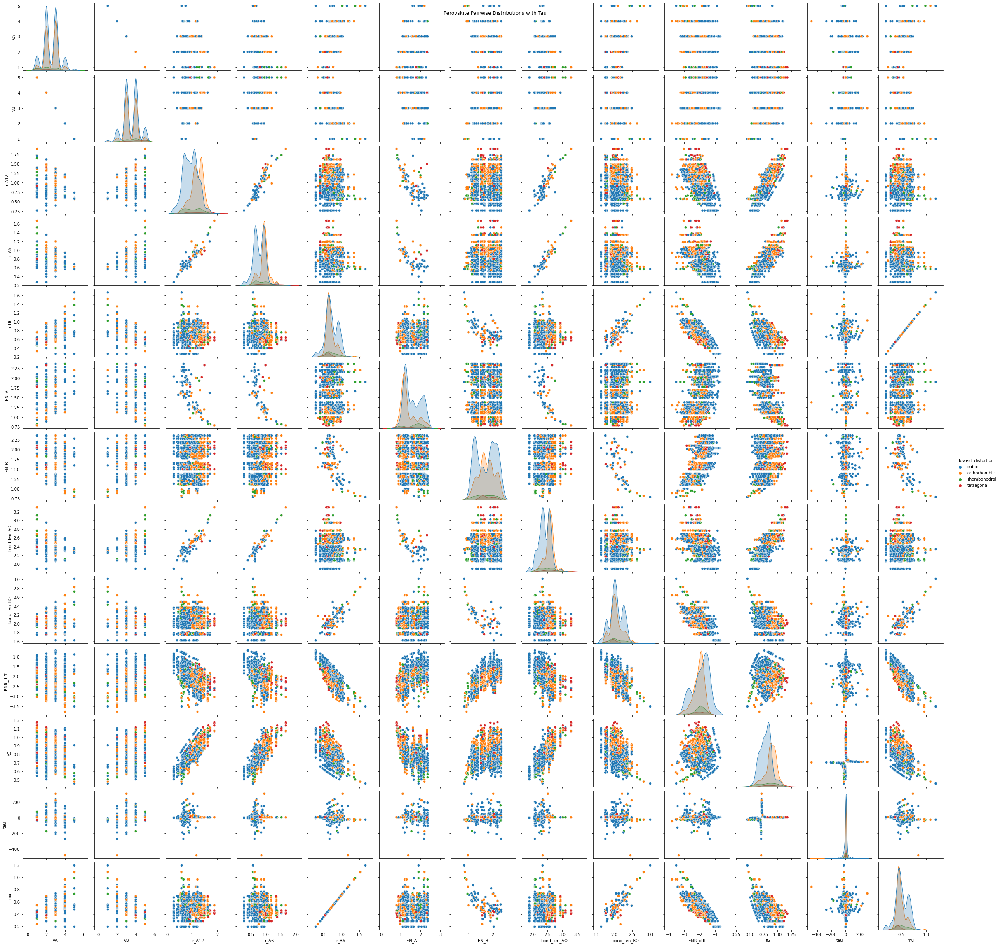

In [27]:
# Create a pairplot of the training dataset with tolerance factor (tau), distinguishing by lowest distortion
pair_plot = sns.pairplot(prv_train_tau, hue="lowest_distortion")

# Set the title of the pairplot
pair_plot.fig.suptitle("Perovskite Pairwise Distributions with Tau")

# Save the pairplot as an image file
pair_plot.savefig("pairplot_perovskite_train_tau.jpg")

# Display the pairplot
plt.show()


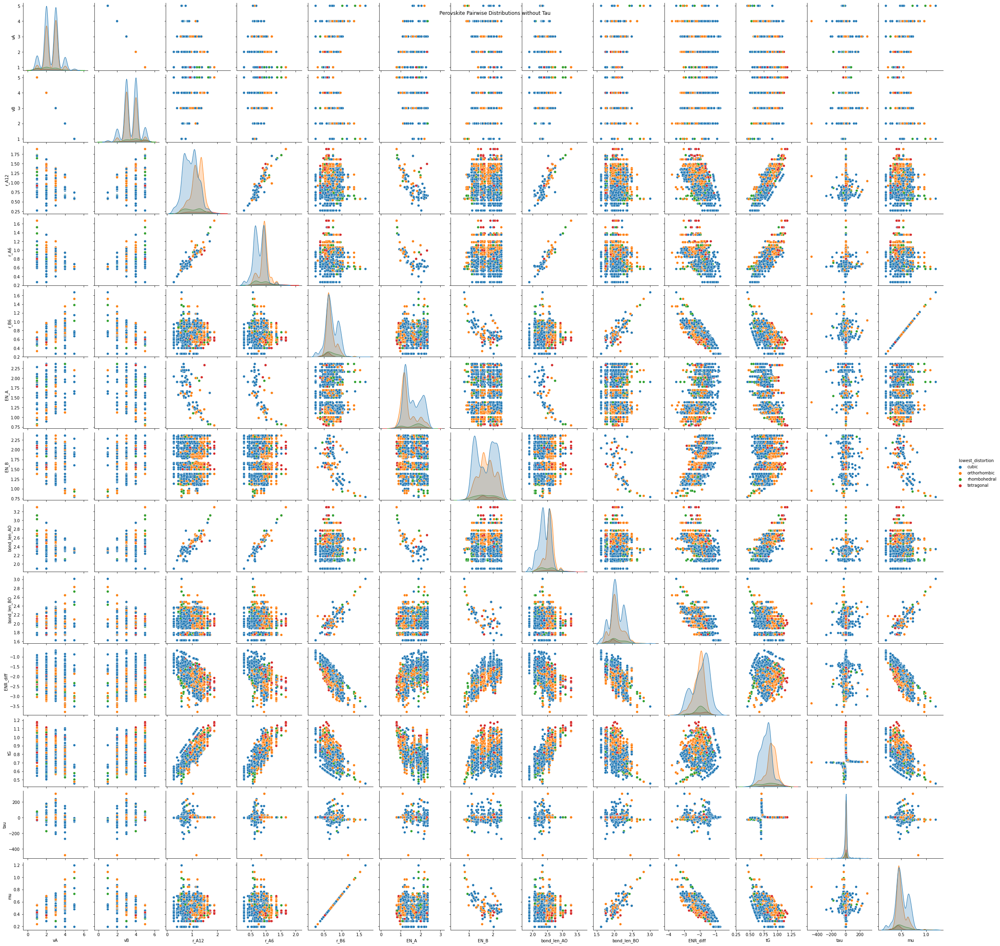

In [28]:
# Create a pair plot of the training dataset without tolerance factor (tau) with hue based on lowest distortion
pair_plot = sns.pairplot(prv_train_tau, hue="lowest_distortion")

# Set the title for the pair plot
pair_plot.fig.suptitle("Perovskite Pairwise Distributions without Tau")

# Save the pair plot as an image
pair_plot.savefig("pairplot_perovskite_train_without_tau.jpg")

# Display the pair plot
plt.show()


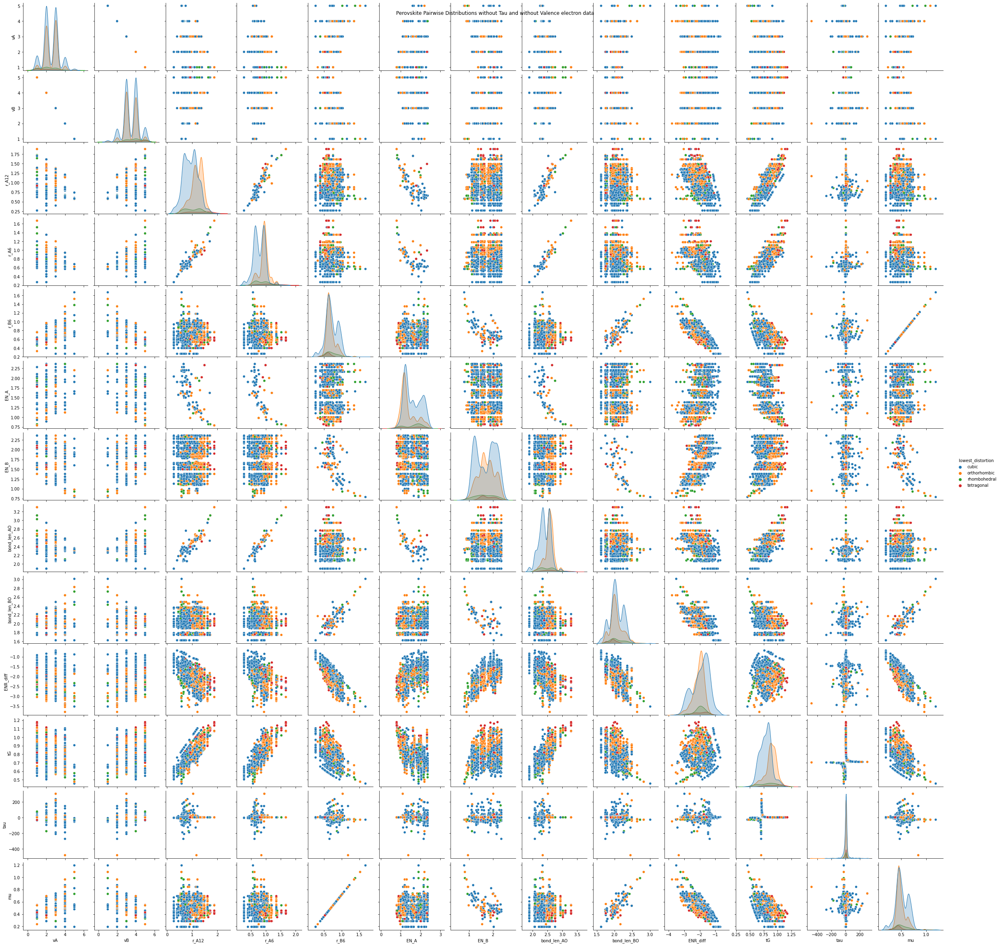

In [29]:
# Create a pair plot of the training dataset without tolerance factor (tau) and without valence electron data
pair_plot = sns.pairplot(prv_train_tau, hue="lowest_distortion")

# Set the title for the pair plot
pair_plot.fig.suptitle("Perovskite Pairwise Distributions without Tau and without Valence electron data")

# Save the pair plot as an image
pair_plot.savefig("pairplot_perovskite_train_without_tau_Ve.jpg")

# Display the pair plot
plt.show()


### Summary

The pair plots are useful in quikly visualizing any data that may be problematic due to a directly linear relationship that would confuse the model. (multivariate)

It is a good practice to plot distribution graphs and look for skewness of features. Kernel density estimate (kde) is a useful tool for plotting the shape of a distribution. (univariate data view, zooming in).

No new or interesting correlations are noted from the pairplot distributions.

### Histograms

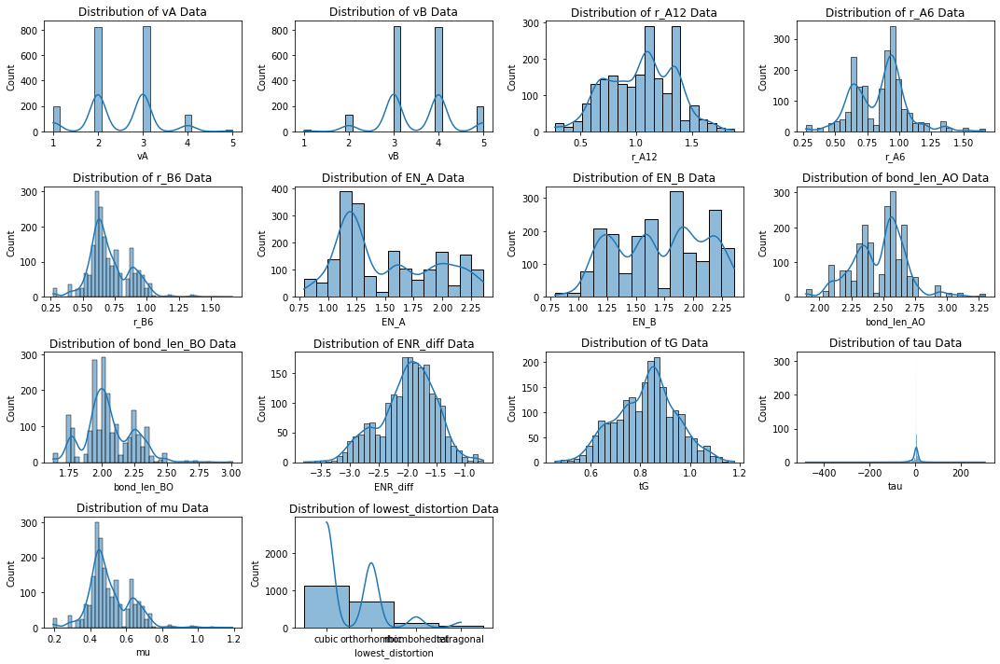

In [30]:
# Set up the figure size for the plot
plt.figure(figsize=(15,10))

# Iterate over each column in the dataframe
for i, col in enumerate(prv_train_tau.columns, 1):
    # Create subplots in a 4x4 grid
    plt.subplot(4, 4, i)
    
    # Set title for each subplot indicating the distribution of data for the corresponding column
    plt.title(f"Distribution of {col} Data")
    
    # Plot the histogram with kernel density estimation using seaborn's histplot function
    sns.histplot(prv_train_tau[col], kde=True)
    
    # Adjust subplot layout
    plt.tight_layout()
    
    # Ensure the plot is shown
    plt.plot()


The valence electron data is showing a discrete pattern as expected and otherwise no notable outliers or abnormal distributions.

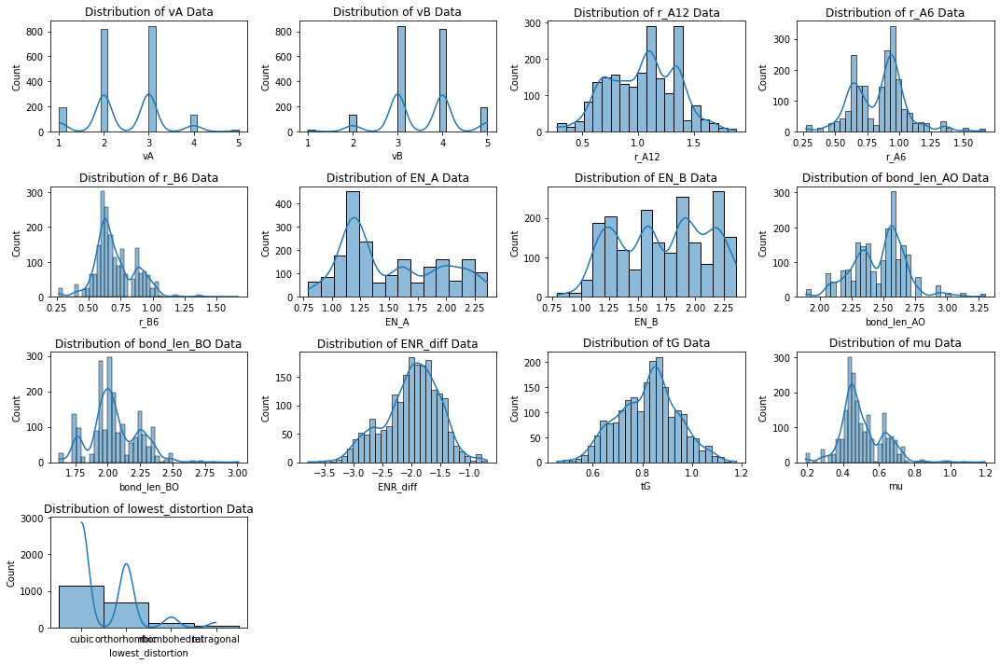

In [31]:
# Set up the figure size for the plot
plt.figure(figsize=(15,10))

# Iterate over each column in the dataframe
for i, col in enumerate(prv_train_no_tau.columns, 1):
    # Create subplots in a 4x4 grid
    plt.subplot(4, 4, i)
    
    # Set title for each subplot indicating the distribution of data for the corresponding column
    plt.title(f"Distribution of {col} Data")
    
    # Plot the histogram with kernel density estimation using seaborn's histplot function
    sns.histplot(prv_train_no_tau[col], kde=True)
    
    # Adjust subplot layout
    plt.tight_layout()
    
    # Ensure the plot is shown
    plt.plot()


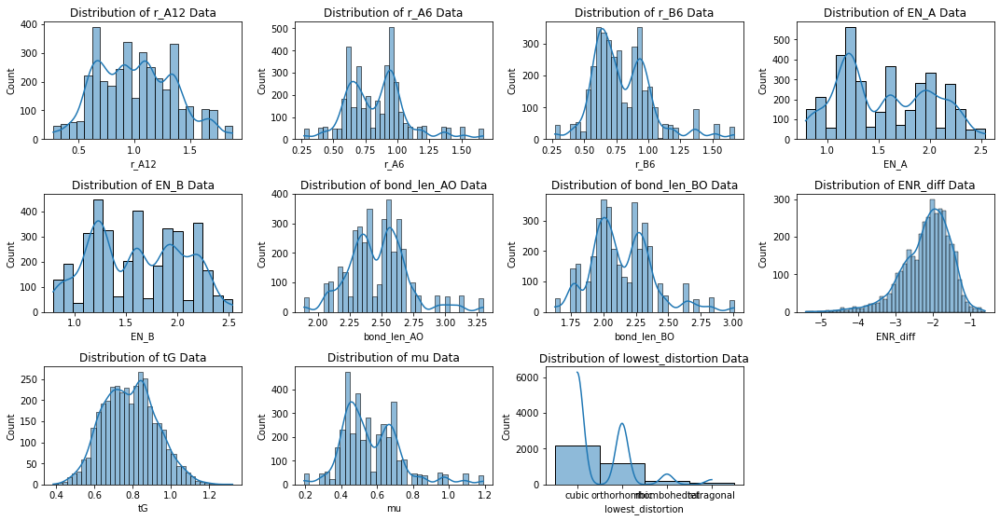

In [32]:
# Set up the figure size for the plot
plt.figure(figsize=(15,10))

# Iterate over each column in the dataframe
for i, col in enumerate(prv_train_no_tau_no_v.columns, 1):
    # Create subplots in a 4x4 grid
    plt.subplot(4, 4, i)
    
    # Set title for each subplot indicating the distribution of data for the corresponding column
    plt.title(f"Distribution of {col} Data")
    
    # Plot the histogram with kernel density estimation using seaborn's histplot function
    sns.histplot(prv_train_no_tau_no_v[col], kde=True)
    
    # Adjust subplot layout
    plt.tight_layout()
    
    # Ensure the plot is shown
    plt.plot()

### Summary

At this point, there doesn't seem to be a need to standardize or normalize the data. 

Since the data already follows a Gaussian (normal) distribution, normalization might not provide significant benefits in terms of scaling the data to a fixed range. With this normally distributed data, standardization is a better choice, but doesn't seem necessary. Standardization could be beneficial for maintaining the integrity of the data's distribution while making it more compatible with algorithms that expect standardized inputs.



### Safety Check

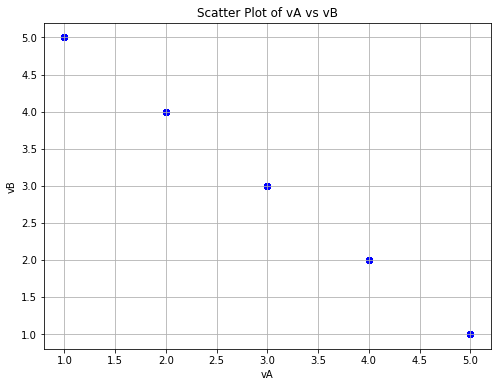

In [33]:
# Extracting the 'vA' and 'vB' columns from the training dataset
vA = prv_train_tau['vA']
vB = prv_train_tau['vB']

# Creating a scatter plot of 'vA' vs 'vB'
plt.figure(figsize=(8, 6))
plt.scatter(vA, vB, color='blue', alpha=0.5)

# Setting the labels for x and y axes
plt.xlabel('vA')
plt.ylabel('vB')

# Setting the title for the scatter plot
plt.title('Scatter Plot of vA vs vB')

# Displaying the grid
plt.grid(True)

# Showing the scatter plot
plt.show()


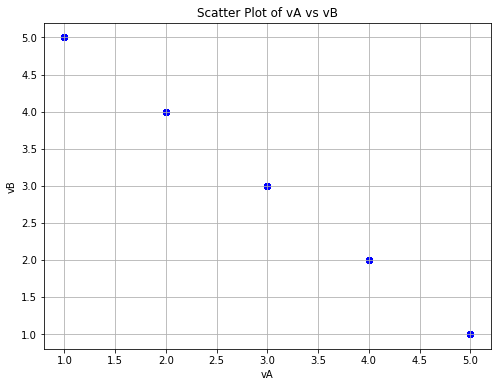

In [34]:
# Extracting the 'vA' and 'vB' columns from the training dataset without tolerance factor
vA = prv_train_no_tau['vA']
vB = prv_train_no_tau['vB']

# Creating a scatter plot of 'vA' vs 'vB'
plt.figure(figsize=(8, 6))
plt.scatter(vA, vB, color='blue', alpha=0.5)

# Setting the labels for x and y axes
plt.xlabel('vA')
plt.ylabel('vB')

# Setting the title for the scatter plot
plt.title('Scatter Plot of vA vs vB')

# Displaying the grid
plt.grid(True)

# Showing the scatter plot
plt.show()


These plots show the linear relationship between the valence electrons. This explicitly shows that vA and vB add up to the constant 6.

## Final dataset choice:

It appears at this point that the dataset that is the most comprehensive would be best suited to answer our shareholders questions. The most comprehensive data set is the set that includes tau.

# Perform a Train-Test Split

In [35]:
# Extracting features (X_tau) and labels (y_tau) from the training dataset with tolerance factor
X_tau = prv_train_tau.loc[:, 'vA':'mu']
y_tau = prv_train_tau.loc[:, 'lowest_distortion']

# Splitting the dataset into training and testing sets
# X contains features and y contains labels/targets
# X_train and y_train will contain the training data, while X_test and y_test will contain the testing (holdout) data
X_train, X_test, y_train, y_test = train_test_split(X_tau, y_tau, test_size=0.2, random_state=42)


Here, test_size=0.2 specifies that 20% of the data will be held out for testing. The random_state is set for reproducibility, ensuring the same split is obtained each time the code is run.

The test data must not be touched.

In [36]:
# Checking the lengths of the training and testing sets
len(X_train), len(X_test)

(1590, 398)

Verify that everything makes sense after the test-train split

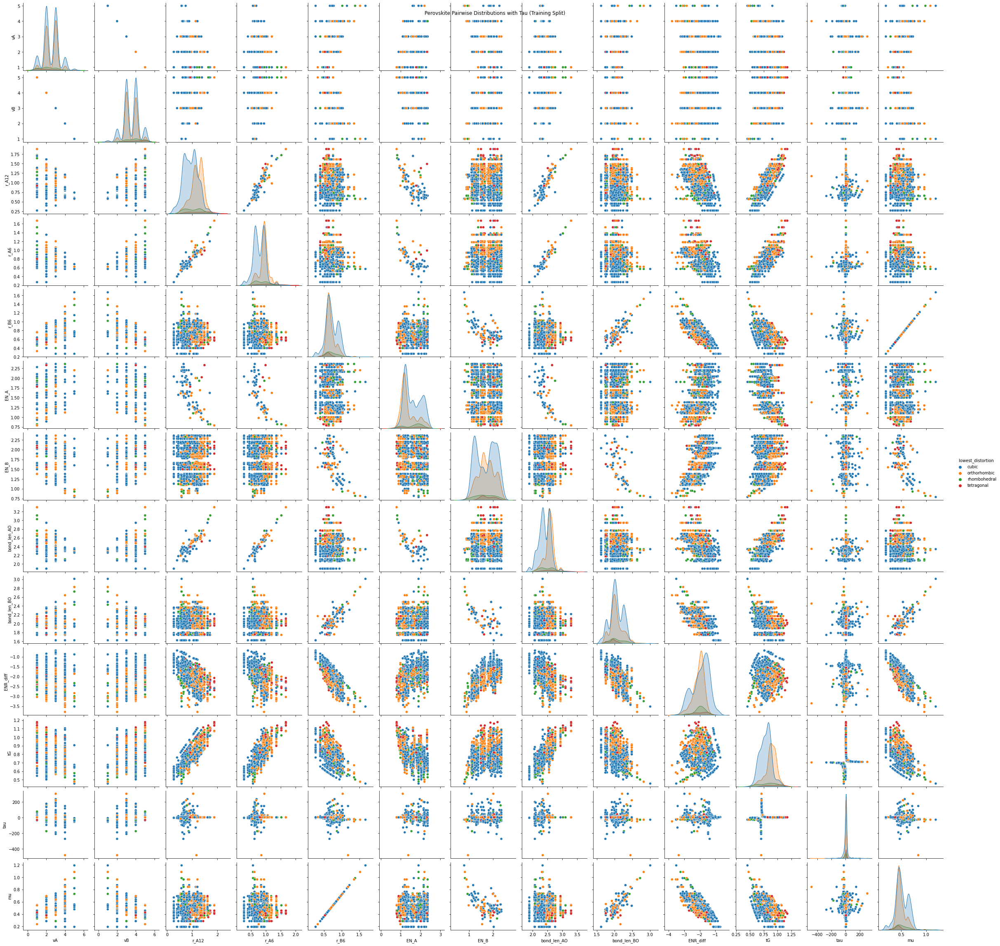

In [37]:
#X_train and y_train are training feature and target variables

#Concatenate X_train and y_train along columns
train_data = pd.concat([X_train, y_train], axis=1)

# Creating a pair plot to visualize pairwise distributions of features in the training dataset with tolerance factor (tau)
pair_plot = sns.pairplot(prv_train_tau, hue="lowest_distortion")

# Adding a title to the pair plot
pair_plot.fig.suptitle("Perovskite Pairwise Distributions with Tau (Training Split)")

# Saving the pair plot as an image
pair_plot.savefig("pairplot_perovskite_tau_training_split.jpg")

# Displaying the pair plot
plt.show()


This is the primary indicator showing linear relationships that need to be monitored. Most linear relationships are not good for ML models because they often oversimplify the underlying patterns in the data and may not capture complex, non-linear relationships effectively (case by case basis, keep an eye on).

Asserting the dimensionality checks is not needed to verify in this case the size of the datasets (what they would asserted to be), because the lengths of the data confirmed that the test-train split did what it was told to do. 


# Decision Tree Model with Stratified K-Fold Cross-Validation

A decision tree provides a good balance between interpretability, flexibility, and performance, making it a suitable choice for exploring the dataset and gaining insights before potentially exploring more complex models. (include stakeholders goals and how this  model mighth meet it)

In [38]:
# Initialize lists to store scores for each fold
precision_scores = []
recall_scores = []
f1_scores = []
accuracy_scores = []

#Step 1, start training
# Initialize StratifiedKFold with 5 splits for cross-validation
kf = StratifiedKFold(n_splits=5)

# Iterate over each fold
for fold, (trn_, val_) in enumerate(kf.split(X=X_train, y=y_train)):
    
    # Split the data into training and validation sets for the current fold
    X_train_Kfold = X_train.iloc[trn_]
    y_train_Kfold = y_train.iloc[trn_]
    
    X_valid = X_train.iloc[val_]
    y_valid = y_train.iloc[val_]
    
    # Initialize a Decision Tree classifier with specified hyperparameters
    DTclf = DecisionTreeClassifier(criterion="entropy",max_depth = 10, random_state=42) #here is where we tune the hyperparameters
    
    # Train the Decision Tree classifier on the training data for the current fold
    DTclf.fit(X_train_Kfold, y_train_Kfold)
    
    # Predict labels for the validation set
    y_pred_Kfold = DTclf.predict(X_valid)
    
    # Calculate scores for the current fold
    report = classification_report(y_valid, y_pred_Kfold, output_dict=True)
    
    # Append precision, recall, F1-score, and accuracy scores to respective lists
    precision_scores.append(report['weighted avg']['precision'])
    recall_scores.append(report['weighted avg']['recall'])
    f1_scores.append(report['weighted avg']['f1-score'])
    accuracy_scores.append(report['accuracy'])
    # Print classification report for the current fold
    print(f"The fold is: {fold}:")
    print(classification_report(y_valid, y_pred_Kfold))

# Calculate average scores across all folds
avg_precision = np.mean(precision_scores)
avg_recall = np.mean(recall_scores)
avg_f1 = np.mean(f1_scores)
avg_accuracy = np.mean(accuracy_scores)

# Print average evaluation metrics across all folds
print(f"Average Precision: {avg_precision}")
print(f"Average Recall: {avg_recall}")
print(f"Average F1-score: {avg_f1}")
print(f"Average Accuracy: {avg_accuracy}")


The fold is: 0:
              precision    recall  f1-score   support

       cubic       0.85      0.83      0.84       178
orthorhombic       0.69      0.77      0.72       113
rhombohedral       0.40      0.21      0.28        19
  tetragonal       0.33      0.38      0.35         8

    accuracy                           0.76       318
   macro avg       0.57      0.55      0.55       318
weighted avg       0.75      0.76      0.75       318

The fold is: 1:
              precision    recall  f1-score   support

       cubic       0.83      0.86      0.84       178
orthorhombic       0.76      0.71      0.73       112
rhombohedral       0.33      0.37      0.35        19
  tetragonal       0.38      0.33      0.35         9

    accuracy                           0.76       318
   macro avg       0.57      0.57      0.57       318
weighted avg       0.76      0.76      0.76       318

The fold is: 2:
              precision    recall  f1-score   support

       cubic       0.85    

In [39]:
print("Raw Counts")
print(prv_train_tau["lowest_distortion"].value_counts())
print()
print("Percentages")
print(prv_train_tau["lowest_distortion"].value_counts(normalize=True))

Raw Counts
cubic           1127
orthorhombic     692
rhombohedral     114
tetragonal        55
Name: lowest_distortion, dtype: Int64

Percentages
cubic           0.566901
orthorhombic    0.348089
rhombohedral    0.057344
tetragonal      0.027666
Name: lowest_distortion, dtype: float64


It is worth bringing up that the accuracy metric doesn't take into account an imbalanced dataset. If we had a model that always predicted a cubic crystal structure, the accuracy score would be only 56% (baseline, for uninformed decision, the worst it could be). (cell 39)

Using the Decision Tree Classifier (model), it is clear that the crystal structure accuracy score is performing better with the  Stratified K Fold performace evaluation at 78%. (cell 38)

These are the example kfold scores (with default guess hyperparameterization) for each fold. At this point, the f1 score seems to be the most comprehensive. The closer the f1 score is to 1, the better the model will be at predicting the target. The closer to a score of 1 means that the model is doing well in both minimizing false positives and false negatives because both the precision and recall are high scores are well. The Decision Tree model was trained once for each of the 5 folds using a random seed of 42 so that the starting point for the randomness is chosen in a way that's consistent and predictable for the purposes of building this experiment. 

Rhombohedral and tetragonal are training on little data so the scores are expected to be low compared to the cubic and orthorhombic which are training on a lot more data.

Here is a great opportunity to tune the hyperparameters and optimize the training before trying out different models. 

## Feature Engineering

In [40]:
# Create a copy of the test/train DataFrame to avoid altering the original
prv_train_tau_bin = prv_train_tau.copy()

# Calculate the absolute electronegativity difference between elements A and B
prv_train_tau_bin['abs_EN_diff']=abs(prv_train_tau_bin['EN_A'] - prv_train_tau_bin['EN_B'])


### Does bond type influence the cyrstal structure shape?

The absolute value of the electronegativity difference between atoms A + B will be classified into different bond types from the describe method as shown here:

| Electronegativity Difference | Bond Type Character | Label Number |
|-----------------|-----------------|-----------------|
| 0.0 - 0.4    | Nonpolar Covalent    | 1    |
| 0.4 - 1.7    | Polar Covalent    | 2    |
| 1.7 +    | Ionic Bond    | 3    |



In [41]:
# Use the Pandas cut method to map the absolute value electronegativity between A+B into the above ranges

# Define cutoff for each bin
prv_train_tau_bin_edges = [0.0, 0.4, 1.7, 4]

# Name each bin
prv_train_tau_bin_names = [1, 2, 3]

# Make column for different ranges into which the values of the 'Electronegativty difference' column are divided
prv_train_tau_bin['abs_EN_diff_bin'] = pd.cut(prv_train_tau_bin.abs_EN_diff, prv_train_tau_bin_edges, labels=prv_train_tau_bin_names, include_lowest = True)

#Display df
print(len(prv_train_tau_bin))
display(prv_train_tau_bin.head())


1988


,vA,vB,r_A12,r_A6,r_B6,EN_A,EN_B,bond_len_AO,bond_len_BO,ENR_diff,tG,tau,mu,lowest_distortion,abs_EN_diff,abs_EN_diff_bin
2,2,4,0.92,0.67,0.53,1.83,1.88,2.290644,1.930311,-1.468464,0.849994,4.936558,0.378571,cubic,0.05,1
3,1,5,1.64,1.38,0.62,0.82,2.36,3.025719,1.745600,-1.974429,1.064161,3.977376,0.442857,orthorhombic,1.54,2
6,1,5,0.92,0.80,0.62,1.78,2.36,2.392362,1.745600,-1.484143,0.812123,5.017992,0.442857,cubic,0.58,2
10,3,3,1.36,1.03,0.90,1.10,1.23,2.689119,2.258656,-2.931286,0.848528,3.536265,0.642857,orthorhombic,0.13,1
11,2,4,1.19,0.99,0.61,1.22,1.54,2.550861,1.927849,-2.040571,0.911148,4.133678,0.435714,orthorhombic,0.32,1


In [42]:
# Remove columns 'abs_EN_diff', 'EN_A', and 'EN_B' from the DataFrame to eliminate redundant or unnecessary features
prv_train_tau_bin.drop(columns=['abs_EN_diff', 'EN_A', 'EN_B'], inplace=True)

#reorder columns
new_order = ['vA', 'vB', 'r_A12', 'r_A6', 'r_B6', 'bond_len_AO', 'bond_len_BO', 'ENR_diff', 'tG', 'tau', 'mu', 'abs_EN_diff_bin', 'lowest_distortion']  # Specify the desired column order

# Reorder the columns
prv_train_tau_bin = prv_train_tau_bin[new_order]


In [43]:
# Splitting the dataset into features (X_tau_bin) and target labels (y_tau_bin)
X_tau_bin = prv_train_tau_bin.loc[:, 'vA':'abs_EN_diff_bin']
y_tau_bin = prv_train_tau_bin.loc[:, 'lowest_distortion']

# Splitting the dataset into training and testing sets
# X_train_bin and y_train_bin will contain the training data, while X_test_bin and y_test_bin will contain the testing data
X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(X_tau_bin, y_tau_bin, test_size=0.2, random_state=42)


In [44]:
# Print the lengths of training and testing data 
len(X_train_bin), len(X_test_bin)

(1590, 398)

In [45]:
from sklearn.metrics import classification_report

# Initialize lists to store scores for each fold
precision_scores_bin = []
recall_scores_bin = []
f1_scores_bin = []
accuracy_scores_bin = []

#Step 1, start training
# Initialize StratifiedKFold with 5 splits for cross-validation
kf = StratifiedKFold(n_splits=5)

# Iterate over each fold
for fold, (trn_, val_) in enumerate(kf.split(X=X_train_bin, y=y_train_bin)):
    
    # Split the data into training and validation sets for the current fold
    X_train_Kfold_bin = X_train_bin.iloc[trn_]
    y_train_Kfold_bin = y_train_bin.iloc[trn_]
    
    X_valid_bin = X_train_bin.iloc[val_]
    y_valid_bin = y_train_bin.iloc[val_]
    
    # Initialize a Decision Tree classifier with specified hyperparameters
    DTclf_bin = DecisionTreeClassifier(criterion="entropy",max_depth=10, random_state=42)#here is where we tune the hyperparameters
    
    # Train the Decision Tree classifier on the training data for the current fold
    DTclf_bin.fit(X_train_Kfold_bin, y_train_Kfold_bin)
    
    # Predict labels for the validation set
    y_pred_Kfold_bin = DTclf_bin.predict(X_valid_bin)
    
    # Calculate scores for the current fold
    report_bin = classification_report(y_valid_bin, y_pred_Kfold_bin, output_dict=True)
    
    # Append precision, recall, F1-score, and accuracy scores to respective lists
    precision_scores_bin.append(report_bin['weighted avg']['precision'])
    recall_scores_bin.append(report_bin['weighted avg']['recall'])
    f1_scores_bin.append(report_bin['weighted avg']['f1-score'])
    accuracy_scores_bin.append(report_bin['accuracy'])

    # Print classification report for the current fold
    print(f"The fold is: {fold}:")
    print(classification_report(y_valid_bin, y_pred_Kfold_bin))

# Calculate average scores across all folds
avg_precision_bin = np.mean(precision_scores_bin)
avg_recall_bin = np.mean(recall_scores_bin)
avg_f1_bin = np.mean(f1_scores_bin)
avg_accuracy_bin = np.mean(accuracy_scores_bin)

# Print average evaluation metrics across all folds
print(f"Average Precision Bin: {avg_precision_bin}")
print(f"Average Recall Bin: {avg_recall_bin}")
print(f"Average F1-score Bin: {avg_f1_bin}")
print(f"Average Accuracy Bin: {avg_accuracy_bin}")



The fold is: 0:
              precision    recall  f1-score   support

       cubic       0.84      0.81      0.83       178
orthorhombic       0.70      0.71      0.70       113
rhombohedral       0.23      0.26      0.24        19
  tetragonal       0.25      0.25      0.25         8

    accuracy                           0.73       318
   macro avg       0.50      0.51      0.51       318
weighted avg       0.74      0.73      0.73       318

The fold is: 1:
              precision    recall  f1-score   support

       cubic       0.79      0.84      0.81       178
orthorhombic       0.75      0.66      0.70       112
rhombohedral       0.29      0.32      0.30        19
  tetragonal       0.33      0.33      0.33         9

    accuracy                           0.73       318
   macro avg       0.54      0.54      0.54       318
weighted avg       0.73      0.73      0.73       318

The fold is: 2:
              precision    recall  f1-score   support

       cubic       0.82    

This is a transformation and evaluation of whether or not the bins helped or not. The addition of the electronegativity difference column is feature engineering with the data. 

The bins do not seem to improve the cross validation scores so we will move forward with the chosen dataset and not the binned dataset. Because the data is continuous and numeric then it isn't expected that any other binning would have much of an impact. 

If the pair plots had shown any bimodal distributions then perhaps binning would be more useful.

## Hyperparameter Tuning

In [46]:
# Start measuring the time taken for grid search
start_time = time.time()

# Set the random seed
N_SEED = 42

# Define the cross-validation strategy
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=N_SEED)

# Define the Decision Tree classifier
DTclf = DecisionTreeClassifier(random_state=N_SEED)

# Define the hyperparameters grid
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Perform grid search
grid_search_cv = GridSearchCV(
    estimator=DTclf,
    param_grid=param_grid,
    scoring='accuracy',
    n_jobs=-1,
    cv=cv)

grid_search_cv.fit(X_train, y_train)

# Measure the time taken for grid search
end_time = time.time()
elapsed_time = end_time - start_time
print("Grid search completed in {:.2f} seconds".format(elapsed_time))

# Print the best hyperparameters found
print(grid_search_cv.best_params_)



Grid search completed in 1.63 seconds
{'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 2}


This hyperparameter tuning is interesting. It could be assumed that unlimited depth (layers/decisions on each branch of the tree) in a tree would be best at producing the highest accuracy, but in this case the hypertuning suggests that only 15 tree layers are needed to optimize the model. This might be because the data set is so small, so it seems like tuning hyperparameters may not make a huge difference.

## Train the Decision Tree Model

The next step will be to train all of the training data not just a piece (split).

In [47]:
# Define the Decision Tree classifier with tuned hyperparameters
all_DTclf = DecisionTreeClassifier(criterion="entropy", max_depth=15, random_state=42, min_samples_leaf=1, min_samples_split=2)

# Train the classifier on the entire training set
all_DTclf.fit(X_train, y_train)  # Final step of training


DecisionTreeClassifier(criterion='entropy', max_depth=15, random_state=42)

## Performace Evaluation

Does the prediction x data match real-life y?

In [48]:
# Step 1: Apply the trained model to the holdout data to make predictions
y_pred_final_DT = all_DTclf.predict(X_test)

# Step 2: Assess the performance of the classifier

# Compute the confusion matrix to evaluate the classification performance
DTconf_matrix = confusion_matrix(y_test, y_pred_final_DT)
print("Confusion Matrix:\n", DTconf_matrix)


Confusion Matrix:
 [[212  22   1   1]
 [ 26  98   5   2]
 [  6   5   9   0]
 [  4   0   2   5]]


<Figure size 2880x2520 with 0 Axes>

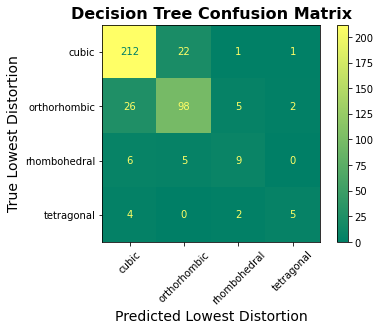

In [66]:
# Create a ConfusionMatrixDisplay object with the confusion matrix and display labels
disp = ConfusionMatrixDisplay(confusion_matrix=DTconf_matrix, display_labels=all_DTclf.classes_)

# Set the size of the plot
plt.figure(figsize=(40, 35))  

# Plot the confusion matrix
disp.plot(cmap='summer')

# Rotate x-axis labels
plt.xticks(rotation=45)  

# Set the title of the plot
plt.title("Decision Tree Confusion Matrix", fontsize=16, fontweight='bold')  

# Set the axis labels
plt.xlabel("Predicted Lowest Distortion", fontsize=14)  
plt.ylabel("True Lowest Distortion", fontsize=14) 

# Visualize confusion matrix
plt.show()

Each row represents the actual class, while each column represents the predicted class.
The value in the first row and first column (212) represents the number of instances where the actual class is 0 and the classifier correctly predicted it as 0 (true negatives).
The value in the second row and first column (26) represents the number of instances where the actual class is 1 but the classifier wrongly predicted it as 0 (false negatives).
The value in the first row and second column (22) represents the number of instances where the actual class is 0 but the classifier wrongly predicted it as 1 (false positives).
The value in the second row and second column (98) represents the number of instances where the actual class is 1 and the classifier correctly predicted it as 1 (true positives).
Similarly, the other values follow the same pattern for their respective classes.

It would appear that the classifier is only able to classify cubic shape with the most accuracy - it's optimized for this shape. This makes sense because the majority of the data points relate to the cubic shape. 

In [68]:
# Calculate the accuracy of the classifier
DTaccuracy = accuracy_score(y_test, y_pred_final_DT)

# Print the accuracy score
print("Accuracy:", DTaccuracy)



Accuracy: 0.8140703517587939


This is great! Tuning the hyperpapameters to maximize the accuracy increased the accuracy from 78% to 81%.

In [69]:
#Generate and print the classification report
DTreport = classification_report(y_test, y_pred_final_DT)
print("Classification Report:\n", DTreport)


Classification Report:
               precision    recall  f1-score   support

       cubic       0.85      0.90      0.88       236
orthorhombic       0.78      0.75      0.77       131
rhombohedral       0.53      0.45      0.49        20
  tetragonal       0.62      0.45      0.53        11

    accuracy                           0.81       398
   macro avg       0.70      0.64      0.66       398
weighted avg       0.81      0.81      0.81       398



This supports the conclusion above with the confusion matrix. This is reasonable given the size of the data set and the simplicity of the decision tree model.

Potentially, a feature could be dropped and this may improve the accuracy of the model. (to consider for next steps) 

To maintain the integrity of the hold out data, not over fitting (trying to get a perfect score) to the hold out data is essential. It IS possible to go back and do some feature engineering as long as the hold out data split is also changed. That way, the simulated real-life data used for the confusion matrix is truly new data each time and not the exact same data over and over, thus simulating real-life data.

## Feature Importance

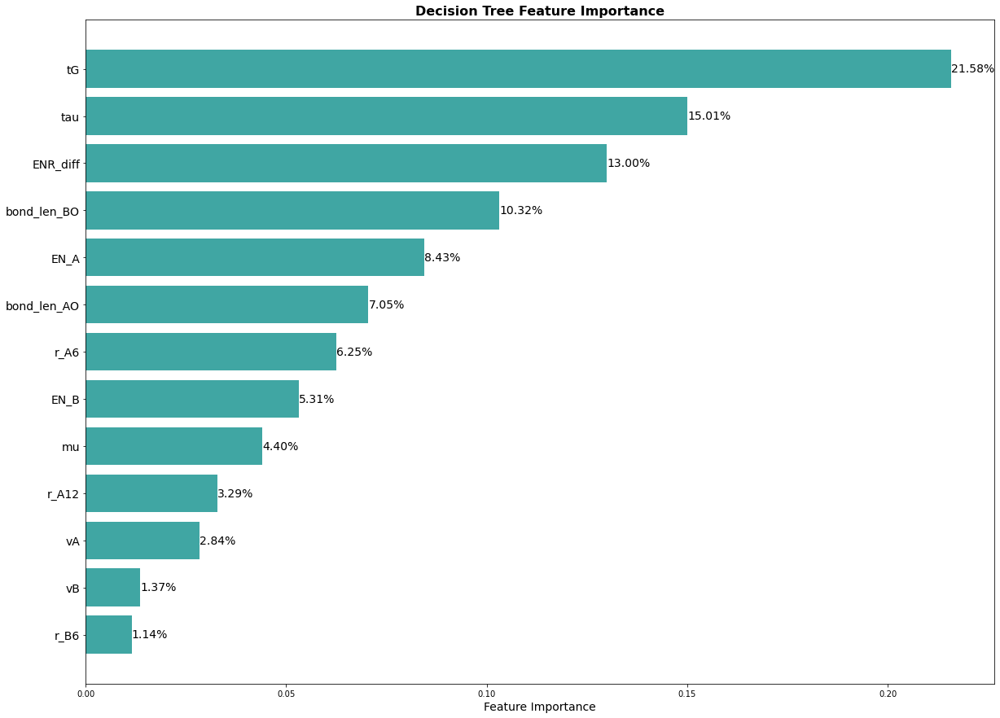

In [70]:
#Step 3, feature importance and printing a visualization

## Checking Feature importance 

# Create a figure with a specific size for the plot
plt.figure(figsize=(20, 15))

# Obtain feature importance from the trained decision tree classifier
DTimportance = all_DTclf.feature_importances_

# Sort the indices of features based on their importance
idxs = np.argsort(DTimportance)

# Set the title of the plot
plt.title("Decision Tree Feature Importance", fontsize=16, fontweight='bold')

# Create horizontal bar plot for feature importance
bars = plt.barh(range(len(idxs)), DTimportance[idxs], align="center", color='#40A6A3')

# Set y-axis labels to feature names based on their importance order
plt.yticks(range(len(idxs)), [X_train.columns[i] for i in idxs], fontsize=14) 

# Set x-axis label
plt.xlabel("Feature Importance", fontsize=14)

# Add percentage labels to the bars
for i, bar in zip(idxs, bars):
    yval = DTimportance[i]
    plt.text(yval, bar.get_y() + bar.get_height()/2, "{:.2%}".format(yval), va='center', fontsize=14)

#Display the plot
plt.show()





## Decision Tree  Model Summary

# Random Forest Model with Stratified K-Fold Cross-Validation

The random forest machine learning model is a similar algorithm however it's ensemble classifier which should provide an improvement from the decision tree classifier.

In [71]:
#start over! #Step 1, start training a different type of algorithm
# Define cross-validation strategy
kf = StratifiedKFold(n_splits=5)

# Iterate over each fold
for fold, (trn_, val_) in enumerate(kf.split(X=X_train, y=y_train)):
    
    # Split data into training and validation sets
    X_train_Kfold = X_train.iloc[trn_]
    y_train_Kfold = y_train.iloc[trn_]
    
    X_valid = X_train.iloc[val_]
    y_valid = y_train.iloc[val_]
    
    # Define Random Forest classifier
    RFclf = RandomForestClassifier(n_estimators=200, criterion="entropy")  # Tuning hyperparameters
    RFclf.fit(X_train_Kfold, y_train_Kfold)  # Train the model
    y_pred_Kfold = RFclf.predict(X_valid)  # Make predictions
    
    # Print classification report for the current fold
    print(f"The fold is: {fold}:")
    print(classification_report(y_valid, y_pred_Kfold))


The fold is: 0:
              precision    recall  f1-score   support

       cubic       0.88      0.93      0.90       178
orthorhombic       0.77      0.81      0.79       113
rhombohedral       0.57      0.21      0.31        19
  tetragonal       0.60      0.38      0.46         8

    accuracy                           0.83       318
   macro avg       0.71      0.58      0.61       318
weighted avg       0.81      0.83      0.81       318

The fold is: 1:
              precision    recall  f1-score   support

       cubic       0.87      0.92      0.89       178
orthorhombic       0.81      0.84      0.82       112
rhombohedral       0.82      0.47      0.60        19
  tetragonal       0.75      0.33      0.46         9

    accuracy                           0.85       318
   macro avg       0.81      0.64      0.69       318
weighted avg       0.84      0.85      0.84       318

The fold is: 2:
              precision    recall  f1-score   support

       cubic       0.87    

## Hyperparameter Tuning

In [72]:
#next step, hyperparameter tuning
start_time = time.time()

# Define random seed and cross-validation strategy
N_SEED = 42 
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=N_SEED)

# Define Random Forest Classifier
RFclf = RandomForestClassifier(random_state=N_SEED)

# Define the hyperparameters grid
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4], 
    'n_estimators': [50, 150, 200, 500] 
}

#Perform grid search
grid_search_cv = GridSearchCV(
    estimator=RFclf,
    param_grid=param_grid,
    scoring='accuracy',
    n_jobs=-1,
    cv=cv)

grid_search_cv.fit(X_train, y_train)

# Calculate and print elapsed time for grid search
end_time = time.time()
elapsed_time = end_time - start_time
print("Grid search completed in {:.2f} seconds".format(elapsed_time))

# Print best hyperparameters found
print(grid_search_cv.best_params_)



Grid search completed in 69.68 seconds
{'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 500}


The impact of hyperparameter tuning might be less pronounced here compared to larger datasets. However, it's still valuable to perform hyperparameter tuning. 

## Train the Random Forest Model

In [73]:
# Initialize a Random Forest classifier with tuned hyperparameters
all_RFclf = RandomForestClassifier(criterion="entropy",max_depth = None, random_state=42, min_samples_leaf=1, min_samples_split=5, n_estimators=500) #random state maintains reproducibility.

# Fit the classifier to the training data
all_RFclf.fit(X_train, y_train) #last step of training
    

RandomForestClassifier(criterion='entropy', min_samples_split=5,
                       n_estimators=500, random_state=42)

## Performance Evaluation
Does the prediction x data match real-life y?

In [74]:
# Step 1: Apply the holdout data to the trained classifier
y_pred_final_RF = all_RFclf.predict(X_test) 

#Step 2: assess the performance of the classifier

# Calculate the confusion matrix
RFconf_matrix = confusion_matrix(y_test, y_pred_final_RF)
print("Confusion Matrix:\n", RFconf_matrix)


Confusion Matrix:
 [[220  15   0   1]
 [ 21 108   1   1]
 [  7   4   9   0]
 [  4   0   3   4]]


This matrix is better. The error in row 2 decreased from about 1/3 to 1/5. 

In [75]:
#still step 2, measures the proportion of correctly classified instances out of the total instances.

# Calculate and print the accuracy score
RFaccuracy = accuracy_score(y_test, y_pred_final_RF)
print("Accuracy:", RFaccuracy)

Accuracy: 0.8567839195979899


In [76]:
#still step 2, These metrics provide insights into the classifier's performance, especially when dealing with imbalanced classes.

#Calculate and print the classification report
RFreport = classification_report(y_test, y_pred_final_RF)
print("Classification Report:\n", RFreport)


Classification Report:
               precision    recall  f1-score   support

       cubic       0.87      0.93      0.90       236
orthorhombic       0.85      0.82      0.84       131
rhombohedral       0.69      0.45      0.55        20
  tetragonal       0.67      0.36      0.47        11

    accuracy                           0.86       398
   macro avg       0.77      0.64      0.69       398
weighted avg       0.85      0.86      0.85       398



## Feature Importance

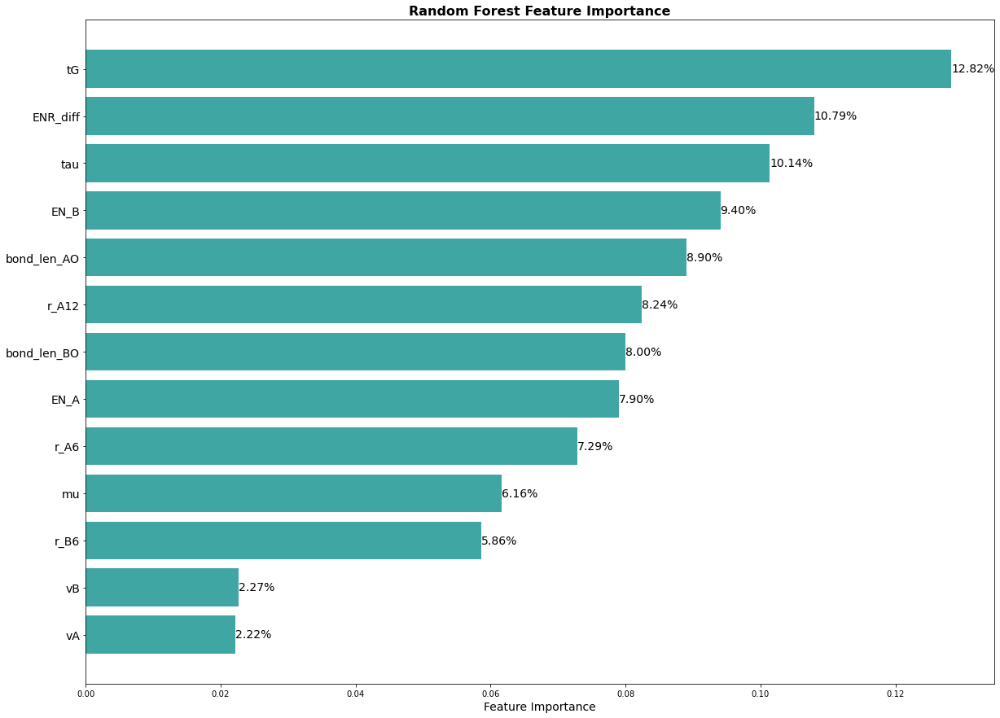

In [77]:
#Step 3, feature importance and printing a visualization

## Checking Feature importance 

# Set plot size
plt.figure(figsize=(20, 15))

# Get feature importance from the trained random forest classifier
RFimportance = all_RFclf.feature_importances_

# Sort indices based on feature importance
idxs = np.argsort(RFimportance)

# Set title
plt.title("Random Forest Feature Importance", fontsize=16, fontweight='bold')

# Create horizontal bar plot for feature importance
bars = plt.barh(range(len(idxs)), RFimportance[idxs], align="center", color='#40A6A3')

# Set y-ticks labels with feature names based on the sorted indices
plt.yticks(range(len(idxs)), [X_train.columns[i] for i in idxs], fontsize=14)  # Assuming X_train is a DataFrame

# Set label for x-axis
plt.xlabel("Feature Importance", fontsize=14)

# Add percentage labels to the bars
for i, bar in zip(idxs, bars):
    yval = RFimportance[i]
    plt.text(yval, bar.get_y() + bar.get_height()/2, "{:.2%}".format(yval), va='center', fontsize=14)

#Show plot    
plt.show()


## Random Forest Model Summary

**REWRITE!!!!!!** 
This feature importance output shows much closer percentages for the top features. This may be highlighting some linear relationships and should be investigated in a future analysis.


relate back to pairwise plot...

There are three scenarios when evaluating the pairwise plot: both features are high importance, both are low importance, and one is high importance.

Feature importance in the pairwise plot may be related to this feature importance chart which can be referenced with the pairwise plot to visually inspect any possible linear relationships.

Find linear relationships and then compare them to the feature importance. EX: vA and vB

# Support Vector Machine Model with Cross-vValidation Score Method

Support Vector Machines (SVM) is a non tree classifier. It was chosen to compare the results of tree and nontree based models. 

Support Vector Machines (SVM) are an effective solution for capturing complex nonlinear relationships in data. Because SVMs have margin maximization objective and regularization parameters, they preform well in high-dimensional or noisy datasets. 

SVMs offer the ability to handle non-linear data through kernel functions, making them a valuable choice after decision trees and random forests in multiclassification problems.

In [ ]:
#third model, Hyperparameter Tuning

# Define the list of kernels to try
kernels = ['linear', 'poly', 'rbf', 'sigmoid']

# Define hyperparameters grid for each kernel
param_grids = {
    'linear': {'C': [0.1, 1, 10, 100]},
    'poly': {'C': [1], 'degree': [3], 'gamma':['scale', 'auto']},
    'rbf': {'C': [0.1, 1, 10, 100], 'gamma': [0.01, 0.1, 1, 10, 'scale', 'auto']},
    'sigmoid': {'C': [0.1, 1, 10, 100], 'gamma': [0.01, 0.1, 1, 10, 'scale', 'auto']}
}

# Iterate over each kernel and perform hyperparameter tuning
for kernel in kernels:
    print(f"Tuning hyperparameters for SVM with {kernel} kernel")
    
    start_time = time.time()
    
    # Define SVM classifier
    SVMclf = SVC(kernel=kernel)
    
    # Define hyperparameters grid
    param_grid = param_grids[kernel]
    
    # Perform grid search
    grid_search_cv = GridSearchCV(
        estimator=SVMclf,
        param_grid=param_grid,
        scoring='accuracy',
        n_jobs=-1,
        cv=cv
    )
    
    grid_search_cv.fit(X_train, y_train)
    
    end_time = time.time()
    elapsed_time = end_time - start_time
    
    #Print results
    print("Grid search for {} kernel completed in {:.2f} seconds".format(kernel, elapsed_time))
    
    print(f"Best parameters for {kernel} kernel: {grid_search_cv.best_params_}")


## Hyperparameter Tuning

In [ ]:
#assess the performance of each SVM classifier with different kernels using cross-validation
start_time = time.time()
# Define SVM classifiers with the best parameters for each kernel
svm_linear = SVC(kernel='linear', C=100)
svm_poly = SVC(kernel='poly', C=1, degree=3, gamma='auto')
svm_rbf = SVC(kernel='rbf', C=10, gamma=10)
svm_sigmoid = SVC(kernel='sigmoid', C=10, gamma=0.01)

# Perform cross-validation for each SVM classifier
svm_linear_scores = cross_val_score(svm_linear, X_train, y_train, cv=5)
svm_poly_scores = cross_val_score(svm_poly, X_train, y_train, cv=5)
svm_rbf_scores = cross_val_score(svm_rbf, X_train, y_train, cv=5)
svm_sigmoid_scores = cross_val_score(svm_sigmoid, X_train, y_train, cv=5)

end_time = time.time()
elapsed_time = end_time - start_time
print("Grid search for {} kernel completed in {:.2f} seconds".format(kernel, elapsed_time))
    

# Print average cross-validation scores
print("Average cross-validation scores:")
print(f"Linear SVM: {svm_linear_scores.mean()}")
print(f"Polynomial SVM: {svm_poly_scores.mean()}")
print(f"RBF SVM: {svm_rbf_scores.mean()}")
print(f"Sigmoid SVM: {svm_sigmoid_scores.mean()}")


These scores provide insights into how well each SVM classifier generalizes to unseen data. The grid search results were used to tune the hyperparameters that are hard coded here.

The best performing SVM classifer is RBF SVM. 

Ranking the SVM classifiers in order of performance from best to worst would be

RBF (Gaussian), Polynomial, Linear, Sigmoid 


## Train the SVM Model

In [ ]:
#Model Training

start_time = time.time()

# Train SVM classifiers with the best hyperparameters for each kernel
svm_linear_best = SVC(kernel='linear', C=100)
svm_rbf_best = SVC(kernel='rbf', C=10, gamma=10)
svm_sigmoid_best = SVC(kernel='sigmoid', C=10, gamma=0.01)
svm_poly_best = SVC(kernel='poly', C=100, degree=3)

svm_linear_best.fit(X_train, y_train)
svm_rbf_best.fit(X_train, y_train)
svm_sigmoid_best.fit(X_train, y_train)
svm_poly_best.fit(X_train, y_train)

# Model Evaluation

# Evaluate the trained SVM classifiers on the test set
svm_linear_accuracy = svm_linear_best.score(X_test, y_test)
svm_rbf_accuracy = svm_rbf_best.score(X_test, y_test)
svm_sigmoid_accuracy = svm_sigmoid_best.score(X_test, y_test)

print("Accuracy on the test set:")
print(f"Linear SVM: {svm_linear_accuracy}")
print(f"RBF SVM: {svm_rbf_accuracy}")
print(f"Sigmoid SVM: {svm_sigmoid_accuracy}")

end_time = time.time()
elapsed_time = end_time - start_time
print("Grid search for {} kernel completed in {:.2f} seconds".format(kernel, elapsed_time))
    


Instead of training all models individually, I may explore ensemble methods that combine predictions from multiple models, in the next steps. 

Ensemble methods include: 
bagging, boosting, and stacking 

These can lead to improved performance compared to individual models. In this case, I might focus on training a diverse set of base models to use in the ensemble.

## Performance Evaluation

In [ ]:
# More Model Evaluation

# Start time for performance measurement
start_time = time.time()
# Confusion matrix and classification report for each SVM classifier
svm_classifiers = {
    'Linear SVM': svm_linear_best,
    'Polynomial SVM': svm_poly_best,
    'RBF SVM': svm_rbf_best,
    'Sigmoid SVM': svm_sigmoid_best
}

for name, clf in svm_classifiers.items():
    print(f"\nEvaluation metrics for {name}:")
    y_pred = clf.predict(X_test)
    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))

# End time for performance measurement    
end_time = time.time()
elapsed_time = end_time - start_time
print("Grid search for {} kernel completed in {:.2f} seconds".format(kernel, elapsed_time))
    

*** figure out what to do here ***

The zero_division parameter in scikit-learn's classification metrics functions where the classification_report controls what happens when there are divisions by zero during the calculation of precision, recall, or F-score. 

-Because some of my classes have few samples, highly likely that there are zeros encountered there.

-If I set zero_division to 0.0  it means that precision, recall, and F1-score will be reported as 0 when there are no predicted samples for a particular class. Setting it to 1.0 will result in precision, recall, and F1-score being reported as 1 when there are no predicted samples for a class. This could artificially inflate or deflate the performance metrics for these classes.

-I may have to address class imbalance issues through techniques like resampling or adjusting class weights.

Resampling
- Undersampling: Randomly remove samples from the majority class ('cubic') to balance the class distribution. This approach reduces the dominance of the majority class and can help improve the model's ability to learn from the minority classes.
- Oversampling: Increase the number of samples in the minority classes ('tetragonal', 'octahedral', and 'rhombohedral') by duplicating existing samples or generating synthetic samples using techniques like SMOTE (Synthetic Minority Over-sampling Technique). This balances the class distribution and provides more representative training data for the minority classes.

OR
Class weighting
- Assign higher weights to the samples from minority classes during model training. This way, the model pays more attention to the minority classes and penalizes misclassifications of these classes more heavily, leading to better overall performance on imbalanced datasets.

-Keeping the warning ensures transparency regarding cases where performance metrics cannot be reliably computed due to insufficient predicted samples for a class.

-In retrospect, I should have chosen ensemble methods like Random Forests or gradient boosting algorithms like XGBoost and LightGBM where the algorithms are specifically designed to handle imbalanced datasets.

-I may keep the warning and consider using another evaluation metric that is less sensitive to class imbalance, such as area under the ROC curve (AUC-ROC).

-Maybe adjust the decision threshold of my classifier to get a balance between precision and recall? This might be useful because the number of false positives and false negatives varies.

-Consider another cross-validation technique like Stratified Shuffle Split. This ensures that each fold contains a representative distribution of all classes. Since I used a stratified K-Fold already, I don't think that this option would change things much.

**REWRITE**

Based on the evaluation metrics for different SVM kernels, the RBF SVM achieves the highest accuracy of 83%, with balanced precision and recall scores across most classes, indicating good performance in distinguishing between different crystal structures. 

All SVM kernels seem to struggle with correctly classifying samples from the 'rhombohedral' and 'tetragonal' classes, as indicated by low precision and recall scores. This might happen because the characteristics of these classes might be very similar or subtly different but challenging to distinguish. Further investigation into improving classification for these classes is needed.


## Feature Importance

In [ ]:
#Feature Importance

# Retrieve coefficients for linear SVM
linear_coef = svm_linear_best.coef_

# Create a dictionary mapping feature names to their coefficients
feature_importance_linear = dict(zip(X_train.columns, linear_coef[0]))

# Sort the features by their coefficients (importance)
sorted_features_linear = sorted(feature_importance_linear.items(), key=lambda x: abs(x[1]), reverse=True)

# Print feature importance
print("Feature Importance for Linear SVM:")
for feature, coef in sorted_features_linear:
    print(f"{feature}: {coef}")


EN_diff: This feature has a negative importance score, indicating that increasing values of EN_diff tend to decrease the predictive performance of the model.
r_B6: increasing values of r_B6 also have a negative impact on the model's performance.
r_A12: Increasing values of r_A12 negatively affect the model's performance.
mu: Higher values of mu have a negative impact on the model's performance.
EN_B: This feature has a positive importance score, indicating that increasing values of EN_B tend to improve the model's performance.
bond_len_AO: Increasing values of bond_len_AO have a negative impact on the model's performance.
EN_A: Higher values of EN_A have a positive impact on the model's performance.
tG: Increasing values of tG tend to decrease the model's performance.
bond_len_BO: Higher values of bond_len_BO have a negative impact on the model's performance.
vA: This feature has a slightly negative importance score.
vB: This feature has a slightly positive importance score.
r_A6: Increasing values of r_A6 slightly decrease the model's performance.
tau: This feature has a very small positive importance score.

For non-linear SVM models (e.g., polynomial, RBF, sigmoid), interpreting feature importance in terms of coefficients is not applicable because these models do not directly produce coefficients like linear SVMs. 

I'll try one of these methods: 

Kernel Methods: For non-linear SVMs, the decision function is often represented in terms of support vectors and their corresponding weights. These support vectors represent instances from the training data that are critical for defining the decision boundary. Analyzing the support vectors can provide some understanding of which features are influential in separating different classes.

Permutation Importance: Permutation importance is a model-agnostic technique that measures the increase in model error when a feature's values are randomly shuffled. By permuting feature values and observing the impact on model performance, you can assess the importance of each feature. This technique is applicable to any machine learning model, including SVMs.

In [ ]:
# Calculate permutation importance for each SVM classifier
svm_importance = {}

for name, clf in svm_classifiers.items():
    result = permutation_importance(clf, X_test, y_test, n_repeats=10, random_state=42)
    svm_importance[name] = result.importances_mean
    
# Print feature importance for each SVM classifier
for name, importance in svm_importance.items():
    print(f"\nFeature Importance for {name}:")
    for i, (feature, importance_score) in enumerate(zip(X_test.columns, importance)):
        print(f"{i + 1}. {feature}: {importance_score}")


## Support Vector Machine Model Summary

# Compare at all 3 models

make a table that compares the accuracy and f1 scores of each model weighted avg f1-score. make a dataframe or matrix compare metrics of the different models.

## Machine Learning Model Comparison

<style>
    .heatMap {
        width: 70%;
        #text-align: center;
    }
    .heatMap th {
        background: light grey;
        #word-wrap: break-word;
        text-align: center;
    }
    .heatMap tr:nth-child(1) { background: white; }
    .heatMap tr:nth-child(2) { background: light grey; }
    .heatMap tr:nth-child(3) { background: white; }
    .heatMap tr:nth-child(4) { background: light grey; }
</style>

<div class="heatMap">

| Model      | Precision | Recall | Accuracy | F1-Score | 
| :---:      |    :----: |  :---: | :---:    | :----:   |
| Decision Tree  | 81%   | 81%    | 81%      | 81%      | 
| Random Forest  | 85%   | 86%    |  86%     | 85%      | 
| RBF Support Vector Machine| 83%   | 83% |  83%      | 82%    |

</div>



these numbers show the best the data can predict.

In [ ]:
|# Set plot size
plt.figure(figsize=(20, 15))

# Define feature importance for each model
RFimportance = all_RFclf.feature_importances_
DTimportance = all_DTclf.feature_importances_
SVMimportance = svm_model.feature_importances_  # feature importances for SVM, can/should I choose just one?

# Get feature names
feature_names = [X_train.columns[i] for i in range(len(X_train.columns))]  # Assuming to use X_train here

# Set the width of the bars
bar_width = 0.2

# Set the positions of the bars on the x-axis
r1 = np.arange(len(feature_names))
r2 = [x + bar_width for x in r1]
r3 = [x + bar_width for x in r2]

# Plotting the bars
plt.bar(r1, DTimportance, color='#00a5ba', width=bar_width, edgecolor='grey', label='Decision Tree')
plt.bar(r2, RFimportance, color='#ffbf00', width=bar_width, edgecolor='grey', label='Random Forest')
plt.bar(r3, SVMimportance, color='#ba0048', width=bar_width, edgecolor='grey', label='SVM')

# Add xticks on the middle of the group bars
plt.xlabel('Feature', fontweight='bold', fontsize=15)
plt.xticks([r + bar_width for r in range(len(feature_names))], feature_names, rotation=90)

# Add ylabel
plt.ylabel('Feature Importance', fontweight='bold', fontsize=15)

# Create legend & Show graphic
plt.legend()
plt.show()


Conclusion



# Summary

## Recommendations

### Each Model Take-Aways

# Next Steps

# References:

1. https://www.kaggle.com/code/durgancegaur/a-guide-to-any-classification-problem#Exploratory-Data-Analysis (Kaggle guide)
2. https://www.kaggle.com/datasets/meetnagadia/crystal-structure-dataset?resource=download (kaggle dataset)
3. https://www.sciencedirect.com/topics/engineering/perovskite-structure#:~:text=As%20shown%20in%20Figure%203,a%20total%20charge%20of%20%2B6. (reference literature)
4. https://en.wikipedia.org/wiki/Perovskite_(structure) (reference literature)
5. https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html (documentation)
6. https://www.nanowerk.com/what-are-perovskites.php (reference literature)
7. https://github.com/scikit-learn/scikit-learn/issues/22230 (documentation)
8. https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html (documentation)
9. https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_val_score.html (documentation)
10. https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html (documentation)
11. https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html (documentation)
12. https://matplotlib.org/stable/users/explain/colors/colormaps.html (documentation)
13. https://www.color-hex.com/ (hex codes)